# Focusing on the North Celestial Pole Loop

Now that I have looked at the SPIDER on its own, it is time to look at the bigger picture. The SPIDER is not just on its own in the sky, it apart of the North Celestial Pole Loop (NCPL) which also connects Ursa Major and Polaris. It is important to look at the NCPL because it can help us find more evidence that a phase transition occured.

________________________________________________________________________________________________________________________

## Import all python libraries

Here, I am importing all python libraries I will be using

In [1]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from ROHSApy import ROHSA
from scipy.optimize import curve_fit
import random
from scipy.stats import norm

# For the mosaic of the maps
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker
from matplotlib.ticker import ScalarFormatter

## Download the cube data

The first thing I need to do is download the data cube. I went to the address: https://www.cita.utoronto.ca/GHIGLS/ to download the data cube. The designated region I am working with is the SPIDER region. 

In [2]:
#!wget https://www.cita.utoronto.ca/GHIGLS/FITS/GHIGLS_SPIDER_Tb.fits

I am also installing ROHSApy.

In [3]:
#!pip install ROHSApy

## Load the data cube

inpainted cube (new cube)

In [4]:
# Now I need to load the data cube that I collected in the above step.
fitsname = "GHIGLS_NCPL_Tb_INPAINTED_SUBCUBE.fits"
hdu = fits.open(fitsname)
hdr = hdu[0].header
cube = hdu[0].data[:,:,:]
# In the PPV cube, there are 3 axes (Representing the three spaces in the list).
# The first is the velocity axis. The others represent the position coordinates, x and y.
cube.shape

(654, 256, 256)

In [5]:
cube[cube != cube] = 0

In order to get the axis to be in units of velocity, need this function which converts pixel units to velocity (km/s)

In [6]:
def spec_2_velocity(CRVAL, CDELT, CRPIX, index):
    '''
    Description: 
        This function takes in the parameters from the header and adjusts the \
        velocity range so that is centers at zero (based on the reference). 
    
    Parameters:
        CRVAL - The value of the reference velocity - float
        CDELT - The value of the channel spacing - float
        CRPIX - The value of the pixel where CRVAL occurs - float
    
    Returns:
        This function returns the adjusted velocity list - list
    '''
    vel = [(CRVAL + CDELT * (index[i] - CRPIX)) for i in range(len(index))]
    # Puts in units of km/s
    
    return vel

Need to adjust the header for the axis to have correct units. I can define where I want my cuts in velocity and/or in the x and y axes, then subtract from the original header.

In [7]:
idx_lim_left = 225; idx_lim_right = 375

In [8]:
hdr["NAXIS3"] = idx_lim_right-idx_lim_left # The range of subvel (end_subvel - start_subvel)
hdr["CRPIX3"] -= idx_lim_left # This is to fix the position of the peaks to have the right index and velocity

In [9]:
index_arr = np.arange(cube.shape[0])

cdelt3 = hdr["CDELT3"]/1000. #This allows it to be in units of km/s rather than m/s
crpix3 = hdr["CRPIX3"]
crval3 = hdr["CRVAL3"]/1000. #This allows it to be in units of km/s rather than m/s

vel = np.array(spec_2_velocity(crval3,cdelt3,crpix3,index_arr))

## Function for producing Gaussians

Here, I define a function for a gaussian function. I will be plotting some gaussians manually, so I need this function for later

In [10]:
# Some constants for the integrals:
dv = abs(cdelt3)
C = 1.82243e18

In [11]:
# Function for a single Gaussian 
def one_gauss_func(x, amp, cent, sigma):
    '''
    Description: 
        Evaluates a Gaussian function given some parameters
    
    Parameters:
        x - Value at which the Gaussian is evaluated at - float
        amp - The amplitude of the Gaussian - float
        cent - The location of the of the peak - float 
        sigma - The width of the peak - float
    
    Returns:
        The function evaluated at x - float
    '''
    return amp*np.exp(-((x-cent)/(2*sigma))**2)

def func(x, *params):
    y = np.zeros_like(x)
    for i in range(0, len(params), 3):
        a = params[i]
        c = params[i+1]
        s = params[i+2]
        y = y + a * np.exp( -((x - c)/(2*s))**2)
    return y

## Define the limits and the region

In [12]:
subvel = vel[:idx_lim_right-idx_lim_left]
subcube = cube[idx_lim_left:idx_lim_right, :, :] # Want the whole spider, so full x and y axes

I can first just plot a random spectrum, then also plot the average spectrum, which will give us more information

In [13]:
# x_rand = 70; y_rand = 110 #interesting point 
# x_rand = 113; y_rand = 145 #interesting point 
# x_rand = 154; y_rand = 23 #interesting point 

x =  142  y =  143


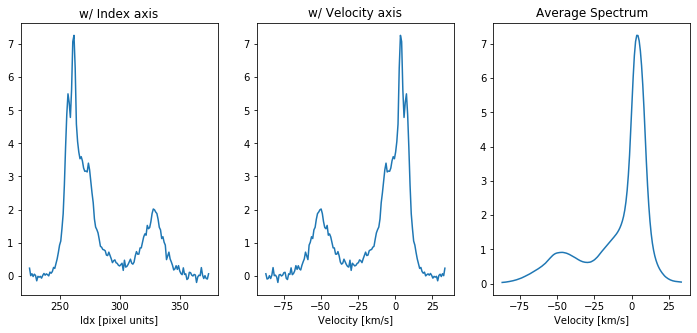

In [14]:
x_rand = random.randint(0,255) ; y_rand = random.randint(0,255)
print('x = ',x_rand,' y = ',y_rand)

avg = np.mean(subcube, (1,2))

plt.figure(figsize=(12,5))
plt.subplot(1,3,1)
plt.title("w/ Index axis"); plt.xlabel("Idx [pixel units]")
plt.plot(index_arr[idx_lim_left:idx_lim_right], subcube[:,y_rand, x_rand])

plt.subplot(1,3,2)
plt.title("w/ Velocity axis"); plt.xlabel("Velocity [km/s]")
plt.plot(subvel, subcube[:,y_rand, x_rand])

plt.subplot(1,3,3)
plt.title("Average Spectrum"); plt.xlabel("Velocity [km/s]")
plt.plot(subvel, avg)

plt.show()

## Noise Map

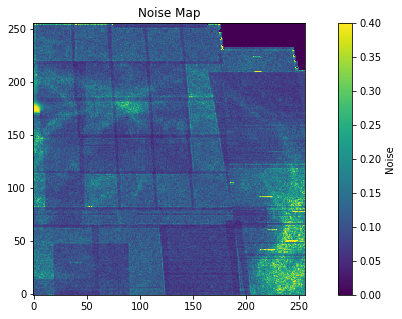

In [15]:
fig=plt.figure(figsize=(12,5))
noise_cube = cube[:24] # Using the first 24 channels of the index axis.
noise_map = np.std(noise_cube, 0)

rms = np.array([noise_map*(1+channel/20) for channel in subcube]) # channel means T_b
plt.title("Noise Map")
plt.imshow(rms[37], origin='lower', vmin=0, vmax=0.4) ; plt.colorbar(label='Noise')
plt.subplots_adjust(wspace=0.5)
#fig.savefig("Noise_map.png", bbox_inches='tight')

## Getting ROHSA to analyze a region

In [16]:
#!git clone https://github.com/antoinemarchal/ROHSA.git ROHSA
#import os
#os.chdir('ROHSA/src')
#!make
#os.chdir('../../')

## Define the ROHSA parameters

Now to set up the parameters for the Gaussian decomposition.

In [17]:
filename = "GHIGLS_NCPL_Tb.dat" #@param
fileout = "GHIGLS_NCPL_Tb_gauss_run_1_100_Noise3D_40G.dat" #@param
filename_parameters = "parameters_NCPL_1_100_Noise3D_40G.txt"
filename_noise = 'Noise_Map_NCPL_1_100_40G.dat'
n_gauss = 40          #@param {type:"slider", min:1, max:12, step:1}                                                                                                                                                                                                                             
lambda_amp = 1      #@param {type:"slider", min:0, max:1000, step:1}
lambda_mu = 1       #@param {type:"slider", min:0, max:1000, step:1}
lambda_sig = 1     #@param {type:"slider", min:0, max:1000, step:1}
lambda_var_amp = 0.                                                                                                                                                                                                                                                           
lambda_var_mu = 0.                                                                                                                                                                                                                                                        
lambda_var_sig = 100  #@param {type:"slider", min:0, max:10000, step:1}                                                                                                                                                                                                                                                            
amp_fact_init = 0.66  # times max amplitude of additional Gaussian                                                                                                                                                                                                                                                          
sig_init = 4.         # dispersion of additional Gaussian                                                                                                                                                                                                                                                                   
init_option = 'mean'  # init ROHSA with the mean or the std spectrum                                                                                                                                                                                                                                                      
maxiter_init = 15000  # max iteration for L-BFGS-B alogorithm init mean                                                                                                                                                                                                                                        
maxiter = 800         #@param {type:"slider", min:1, max:800, step:1}                                                                                                                                                                                                                                                         
m = 10                # number of corrections used in the limited memory matrix                                                                                                                                                                                                                               
noise = ".true."     # if false - STD map computed by ROHSA with lstd and ustd                                                                                                                                                                                                           
regul = ".true."      # if true - activate regulation                                                                                                                                                                                                                                                                 
descent = ".true."    #@param [".true.", ".false."]                                                                                                                                                                                                                       
lstd = 1              #@param {type:"slider", min:1, max:400, step:1}                                                                                                                                                                                                                
ustd = 20             #@param {type:"slider", min:1, max:400, step:1}                                                                                                                                                                                                                 
iprint = -1           #@param ["-1", "0", "1"]                                                                                                                                                                                                                                                                                      
iprint_init = -1      # print option init                                              
save_grid = ".false." #@param [".true.", ".false."] 
lb_sig_init = 0.1
ub_sig_init = 10.
lb_sig = 0.1
ub_sig = 100.

core = ROHSA(subcube, hdr=hdr)  
core_rms = ROHSA(rms)
core.cube2dat(filename=filename)
core_rms.cube2dat(filename=filename_noise)
core.gen_parameters(filename=filename, 
                    fileout=fileout,
                    filename_noise=filename_noise,
                    filename_parameters=filename_parameters,
                    n_gauss=n_gauss,
                    lambda_amp=lambda_amp,
                    lambda_mu=lambda_mu,
                    lambda_sig=lambda_sig,
                    lambda_var_sig=lambda_var_sig,
                    noise=noise,
                    maxiter=maxiter,
                    descent=descent,
                    lstd=lstd,
                    ustd=ustd,
                    iprint=iprint,
                    lb_sig_init=lb_sig_init,
                    ub_sig_init=ub_sig_init,
                    lb_sig = lb_sig,
                    ub_sig = ub_sig,
                    save_grid=save_grid)

Generate GHIGLS_NCPL_Tb.dat file readable by fortran
Generate Noise_Map_NCPL_1_100_40G.dat file readable by fortran
Generate parameters_NCPL_1_100_Noise3D_40G.txt file


In [18]:
#! ./ROHSA/src/ROHSA parameters_NCPL_1_100_Noise3D_40G.txt

## Obtain the Gaussian parameters for the decomposition

In [19]:
gaussian = core.read_gaussian("GHIGLS_NCPL_Tb_gauss_run_1_100_Noise3D_40G.dat")
params = core.physical_gaussian(gaussian)

print("dim cube = " + str(gaussian.shape))

model = core.return_result_cube(gaussian=gaussian)

# Physical Space
amplitude = gaussian[0::3]
position = np.array(spec_2_velocity(crval3,cdelt3,crpix3,gaussian[1::3]))
dispersion = gaussian[2::3] * dv

# "Pixel" Space
amplitude_pix = gaussian[0::3]
position_pix = gaussian[1::3]
dispersion_pix = gaussian[2::3]

integral = amplitude * dispersion * np.sqrt(2*np.pi) 

Opening data file
dim cube = (120, 256, 256)


In [20]:
NHI_map = integral * C

## Plot a Spectrum

Now, I want to plot a random spectrum / pixel in this region

In [74]:
def plot_spect(x_pos, y_pos, vel, model, cube, gaussian, model2="None", caption=""):
    #fig = plt.figure(figsize=(8,6))
    plt.xlabel("$v$ [km s$^{-1}$]")
    plt.ylabel("T$_{b}$ [K]")
    plt.plot(vel, cube, color='cornflowerblue',  label="data")
    plt.plot(vel, model , 'r', label="model (pix by pix)")
    if model2 != "None":
        plt.plot(vel, model2 , 'g', label="model (comp by comp)")
    
    # To plot all the gaussians under the model and data:
    for i in range(n_gauss):
            plt.plot(vel, core.gauss(np.arange(len(vel)), \
                                              gaussian[0::3][i][y_pos,x_pos],\
                                              gaussian[1::3][i][y_pos,x_pos],\
                                              gaussian[2::3][i][y_pos,x_pos]), 'k')
    plt.legend()
    #plt.show()
    #fig.savefig(caption, bbox_inches="tight")

def legend_without_duplicate_labels(ax):
    handles, labels = ax.get_legend_handles_labels()
    unique = [(h, l) for i, (h, l) in enumerate(zip(handles, labels)) if l not in labels[:i]]
    ax.legend(*zip(*unique), loc='upper right')

def plot_spect_color(x, y, v, model, cube, gaussian, caption=""):
    fig = plt.figure(figsize=(12,6.5))
    ax = fig.add_subplot(111)
    ax.set_xlabel("v [$km$ $s^{-1}$]")
    ax.set_ylabel("T$_{b}$ [$K$]")
    ax.plot(v, cube, color='green',  label="data")
    ax.plot(v, model , color='black', label="model")
    
    # To plot all the gaussians under the model and data:
    for i in range(n_gauss):
        gauss = core.gauss(np.arange(len(v)), gaussian[0::3][i][y,x], gaussian[1::3][i][y,x], gaussian[2::3][i][y,x])
        if gaussian[2::3][i][y,x] < 3.:
            ax.plot(v, gauss, color='deepskyblue', label="CNM")
            #ax.fill_between(v, gauss.min(), gauss, facecolor="____", alpha=0.2)
        if gaussian[2::3][i][y,x] >=3. and gaussian[2::3][i][y,x] < 6.:
            ax.plot(v, gauss, color='darkorchid', label="UNM")
            #ax.fill_between(v, gauss.min(), gauss, facecolor="____", alpha=0.2)
        if gaussian[2::3][i][y,x] >= 6.:
            ax.plot(v, gauss, color='red', label="WNM")
            #ax.fill_between(v, gauss.min(), gauss, facecolor="____, alpha=0.2)
            
    legend_without_duplicate_labels(ax)
    plt.show()
    #fig.savefig(caption, bbox_inches="tight")

x =  67
y =  66


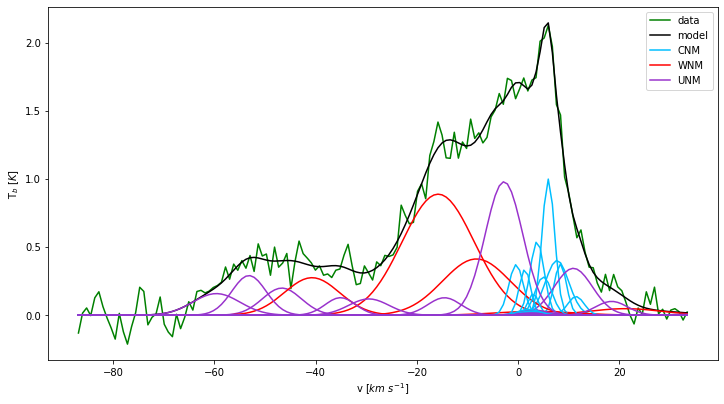

The column density for each Gaussian: 
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 6.50981708e+16 9.47249424e+16
 9.52257940e+16 1.48849500e+17 2.06970926e+17 2.24935241e+17
 2.41449970e+17 2.88434759e+17 4.09611988e+17 4.32541755e+17
 4.82610052e+17 7.67996100e+17 1.01415751e+18 1.02120149e+18
 1.46488346e+18 1.57080437e+18 1.74515111e+18 1.77042170e+18
 1.92716536e+18 2.10042124e+18 2.13774747e+18 2.18555403e+18
 2.43346508e+18 3.38357878e+18 3.42855990e+18 3.51043856e+18
 4.26357431e+18 4.49331953e+18 5.68764910e+18 5.93885273e+18
 6.83819878e+18 1.26543535e+19 1.66382706e+19 2.89402297e+19] 

The fractional column density for each Gaussian: 
 [0.         0.         0.         0.         0.         0.
 0.00054886 0.00079865 0.00080287 0.00125499 0.00174502 0.00189648
 0.00203572 0.00243186 0.00345354 0.00364687 0.004069   0.00647516
 0.00855061 0.00861    0.01235079 0.01324384 0.0147138  0.01492686
 0.0162484  0.01770917 0.01802387 0.

In [22]:
x_pos = random.randint(0,255) ; y_pos = random.randint(0,255)
print("x = ", x_pos) ; print("y = ", y_pos)

plot_spect_color(x_pos, y_pos, subvel, model[:, y_pos, x_pos], subcube[:, y_pos, x_pos], gaussian)
plt.show()

#Now can look at these Gaussians to see if they are significant by looking at the integral

integral_spectrum = (amplitude[:,y_pos,x_pos] * dispersion[:,y_pos,x_pos] * np.sqrt(2*np.pi) * C)
sum_of_integral = np.sum(integral_spectrum)
frac_integral = integral_spectrum / sum_of_integral
print("The column density for each Gaussian: \n",np.sort(integral_spectrum), '\n')
print("The fractional column density for each Gaussian: \n",np.sort(frac_integral))

## Find the value of $\chi^{2}$

### Map of Degrees of Freedom

In [23]:
free_params_map = np.zeros((subcube.shape[2],subcube.shape[1]))
signif_gauss_map = np.zeros((subcube.shape[2],subcube.shape[1]))
lim_for_signif_gauss = 2.e-2

for j in range(subcube.shape[2]):
    for i in range(subcube.shape[1]):
        
        integral_spectrum = (amplitude[:,j,i] * dispersion[:,j,i] * np.sqrt(2*np.pi) * C)
        sum_integ_spec = np.sum(integral_spectrum)
        frac_integral = integral_spectrum / sum_integ_spec
        
        num_good_gauss = 0
        for k in range(n_gauss):
            
            if frac_integral[k] > lim_for_signif_gauss:
                num_good_gauss = num_good_gauss + 1
                
        signif_gauss_map[j][i] = num_good_gauss
        free_params_map[j][i] = (idx_lim_right-idx_lim_left) - 3*num_good_gauss

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


mean of significant gaussians =  14.076812744140625
mean of insignificant gaussians =  25.923187255859375


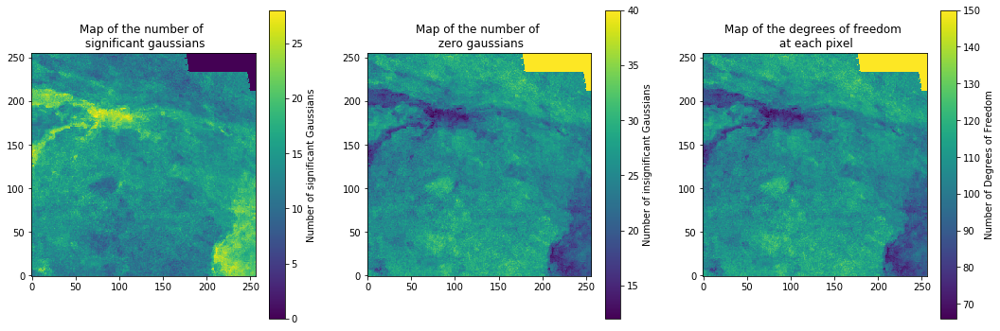

In [24]:
# Can plot a map of the number of free parameters at each pixel
fig = plt.figure(figsize=(18,6))
plt.subplot(1,3,1) ; plt.title("Map of the number of \n significant gaussians")
plt.imshow(signif_gauss_map, origin='lower') ; plt.colorbar(label="Number of significant Gaussians")
plt.subplot(1,3,2) ; plt.title("Map of the number of \n zero gaussians")
plt.imshow(n_gauss - signif_gauss_map, origin='lower') ; plt.colorbar(label="Number of insignificant Gaussians")
plt.subplot(1,3,3) ; plt.title("Map of the degrees of freedom \n at each pixel")
plt.imshow(free_params_map, origin='lower') ; plt.colorbar(label="Number of Degrees of Freedom")
plt.subplots_adjust(wspace=0.2)

print("mean of significant gaussians = ", np.mean(signif_gauss_map))
print("mean of insignificant gaussians = ", np.mean(n_gauss - signif_gauss_map))
#fig.savefig("Map_of_Degrees_of_Freedom_and_Significant_Gauss.png", bbox_inches='tight')

### Map of $\chi^{2}$

In [25]:
noise_cube = cube[:24] # Using the first 24 channels of the index axis.
noise_map = np.std(noise_cube, 0)

rms = np.array([noise_map*(1+channel/20) for channel in subcube]) # channel here means T_b

In [26]:
diff = (model - subcube)

chi_sq_map = np.sum((diff / rms)**2, 0)
chi_sq_map[chi_sq_map != chi_sq_map] = 0
red_chi_sq_map = chi_sq_map / free_params_map
red_chi_sq_map[red_chi_sq_map != red_chi_sq_map] = 0

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


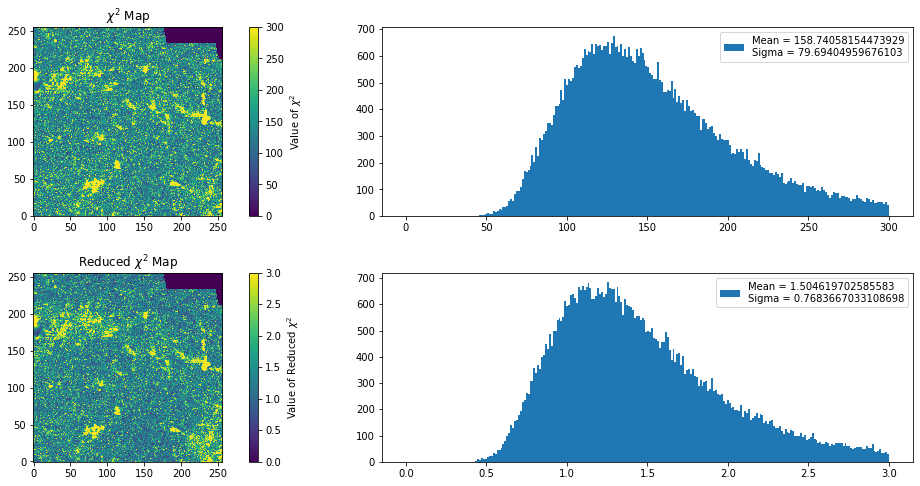

In [27]:
fig = plt.figure(figsize=(20,8))
plt.subplot(2,2,1)
plt.title("$\chi^{2}$ Map")
plt.imshow(chi_sq_map, origin='lower', vmin=0, vmax=300.) ; plt.colorbar(label="Value of $\chi^{2}$")
plt.subplot(2,2,2)
y_chisq_map, x_chisq_map, _chisq_map = plt.hist(chi_sq_map.ravel(), bins=250, range=[1e-20,300.], label="Mean = "+str(np.mean(chi_sq_map))+"\nSigma = "+str(np.sqrt(np.var(chi_sq_map))))
plt.legend()
plt.subplot(2,2,3)
plt.title("Reduced $\chi^{2}$ Map")
plt.imshow(red_chi_sq_map, origin='lower', vmin=0, vmax=3.) ; plt.colorbar(label="Value of Reduced $\chi^{2}$")
plt.subplot(2,2,4)
y_red_chisq_map, x_red_chisq_map, _red_chisq_map = plt.hist(red_chi_sq_map.ravel(), bins=250, range=[1e-20,3.], label="Mean = "+str(np.mean(red_chi_sq_map))+"\nSigma = "+str(np.sqrt(np.var(red_chi_sq_map))))
plt.legend()
plt.subplots_adjust(wspace=0.1, hspace=0.3)
#fig.savefig("Map_of_Chi2_with_Histogram.png", bbox_inches='tight')

The following pixel spectrum represents the one with the worst chi squared value.

x =  150
y =  195
value of chi squared for this spectrum:  1590.6878469666663


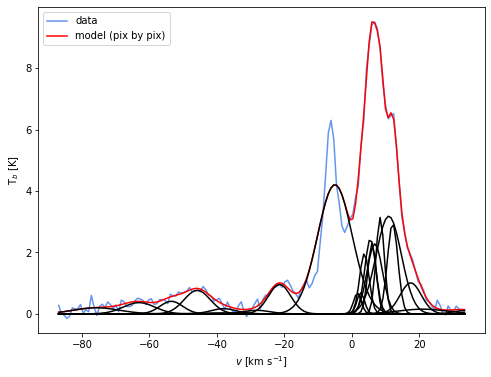

In [28]:
y_pos, x_pos = np.unravel_index(chi_sq_map.argmax(), chi_sq_map.shape)
print("x = ", x_pos) ; print("y = ", y_pos)
print("value of chi squared for this spectrum: ",chi_sq_map[y_pos][x_pos])

plot_spect(x_pos, y_pos, subvel, model[:, y_pos, x_pos], subcube[:, y_pos, x_pos], gaussian)

This was actually determined to be a problem due to RFI (Radio Frequency Interference) when the data recording was done.

### Map of $\chi^{2}$ Contribution

In [29]:
chi_sq_contrib = (diff / rms)**2
chi_sq_contrib[chi_sq_contrib != chi_sq_contrib] = 0

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


channel = 10


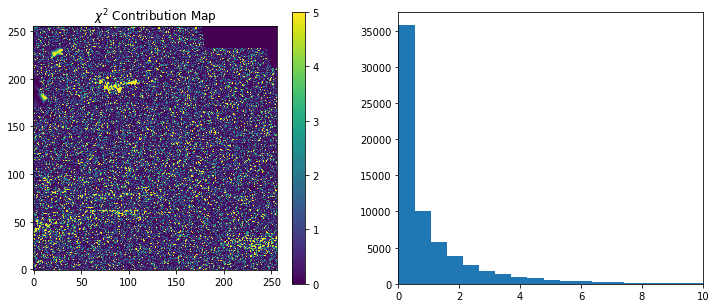

In [30]:
channel = np.random.randint(0,150)
print("channel =", channel)
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.title("$\chi^{2}$ Contribution Map")
plt.imshow(chi_sq_contrib[channel], origin='lower', vmin=0, vmax=5.) ; plt.colorbar()
plt.subplot(1,2,2)
plt.xlim(0,10)
y_chisq_contrib, x_chisq_contrib, _chisq_contrib = plt.hist(chi_sq_contrib[channel].ravel(), bins=250)
plt.show()

## Plot a mosaic of spectra

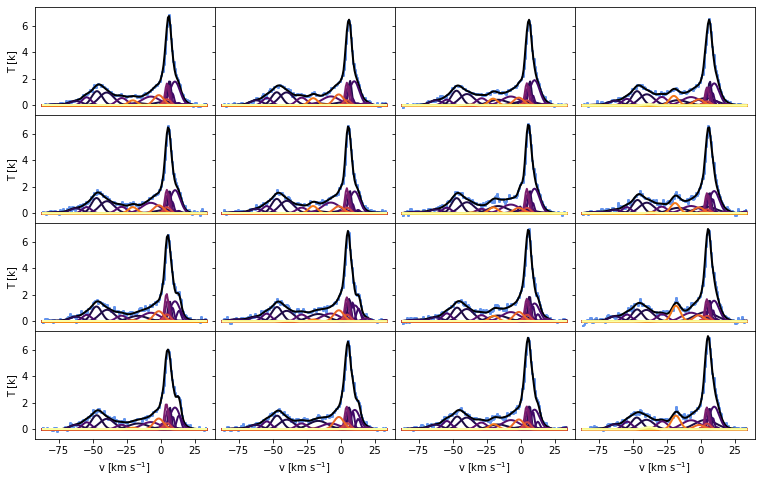

In [31]:
# Mosaic of the Spectra
x_pos = np.random.randint(0,255)
y_pos = np.random.randint(0,255)

pvalues = np.logspace(-1, 0, n_gauss)
pmin = pvalues[0]
pmax = pvalues[-1]

def norm(pval):
    return (pval - pmin) / float(pmax - pmin)

ny = 4; nx = 4
center_y = y_pos; center_x = x_pos
cb = "magenta"
cw = "crimson"
fig, axs = plt.subplots(nx, ny, sharex=True, sharey=True, figsize=(10.,6.))
fig.subplots_adjust(hspace=0, wspace=0, left=0, right=1, top=1, bottom=0)
for i in np.arange(ny):
    for j in np.arange(nx):
        axs[i][j].step(subvel, subcube[:,center_y+i,center_x+j], color='cornflowerblue', linewidth=2.)
        axs[i][j].plot(subvel, model[:,center_y+i,center_x+j], linestyle="-", linewidth=2., color="k")
        for k in range(n_gauss):
            axs[i][j].plot(subvel, core.gauss(np.arange(len(subvel)), gaussian[0::3][k][center_y+i,center_x+j],
                                              gaussian[1::3][k][center_y+i,center_x+j], gaussian[2::3][k][center_y+i,center_x+j]),
                           linewidth=2., color=plt.cm.inferno(pvalues[k]))
        if j == 0: axs[i][j].set_ylabel(r'T [k]')
        axs[i][j].set_xlabel(r'v [km s$^{-1}$]')
#fig.savefig("Mosaic_of_Spectra.pdf", bbox_inches='tight')

## 2D Histogram

In [32]:
iddx = np.argsort(np.mean(position, axis=(1,2)))
field = np.array([NHI_map[idd] for idd in iddx])
vfield = np.array([position[idd] for idd in iddx])
pixfield = np.array([position_pix[idd] for idd in iddx])
ampfield = np.array([amplitude[idd] for idd in iddx])
sigfield = np.array([dispersion[idd] for idd in iddx])

In [33]:
LVC_IVC1_bound_CNM_UNM = -15.
LVC_IVC1_bound_WNM = -20
IVC1_IVC2_bound = -36.
CNM_UNM_LVC_bound = 2.0
CNM_UNM_IVC1_2_bound = 2.5
UNM_WNM_bound = 5.3

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log10


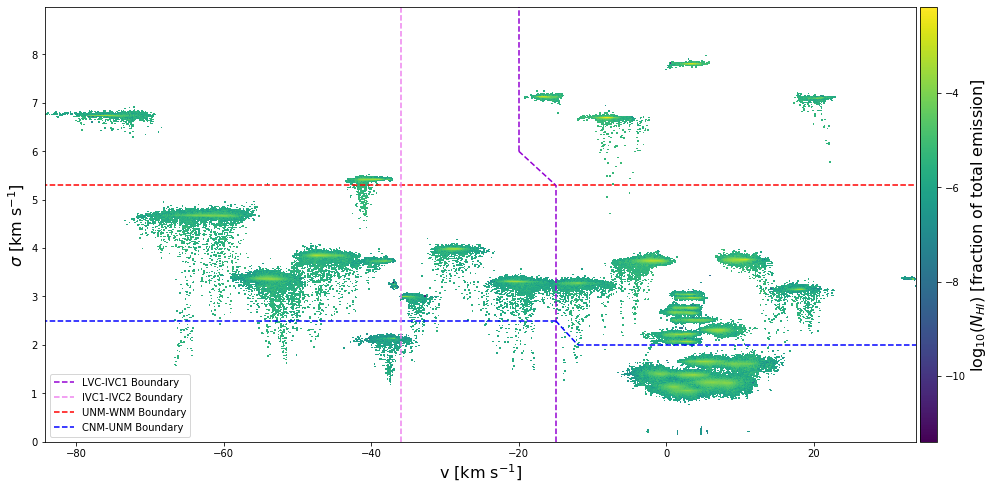

In [34]:
xs_p = np.linspace(-20,-15, 100)
ys_p = -0.14*xs_p + 3.2
xs_b = np.linspace(-15,-12,100)
ys_b = -(1/6)*xs_b
x_bins = np.linspace(np.min(vfield.ravel()), np.max(vfield.ravel()), 1200)
y_bins = np.linspace(0.1,np.max(sigfield)+1, 1200)
H, xedges, yedges = np.histogram2d(vfield.ravel(), sigfield.ravel(),
                                   weights=np.sqrt(2.*np.pi)*ampfield.ravel()*(sigfield.ravel())*C/np.sum(field),
                                   bins=[x_bins, y_bins])
H = np.ma.masked_invalid(np.atleast_2d(H))
fig = plt.figure(figsize=(16.,8.))
plt.axvline(x=LVC_IVC1_bound_CNM_UNM, ymin=0., ymax=UNM_WNM_bound/(np.max(sigfield)+1), color='darkviolet', linestyle='--', label="LVC-IVC1 Boundary")
plt.axvline(x=LVC_IVC1_bound_WNM,ymin=6./(np.max(sigfield)+1), color='darkviolet', linestyle='--')
plt.axvline(x=IVC1_IVC2_bound, color='violet', label="IVC1-IVC2 Boundary", linestyle='--')
plt.hlines(y=UNM_WNM_bound,xmin=-90, xmax=40, color='red', label="UNM-WNM Boundary", linestyle='--')
plt.hlines(y=CNM_UNM_LVC_bound,xmin=LVC_IVC1_bound_CNM_UNM+3, xmax=40, color='blue', linestyle="--")
plt.hlines(y=CNM_UNM_IVC1_2_bound ,xmin=-90, xmax=LVC_IVC1_bound_CNM_UNM, color='blue', label="CNM-UNM Boundary", linestyle='--')
plt.plot(xs_p, ys_p, color='darkviolet', linestyle='--')
plt.plot(xs_b, ys_b, color='blue', linestyle='--')
plt.legend(loc='lower left')
ax = fig.add_subplot(111)
ax.set_ylim([0., np.max(sigfield)+1])
ax.set_xlim([np.min(vfield.ravel()),np.max(vfield.ravel())])
ax.set_xlabel(r'v [km s$^{-1}$]',  fontsize = 16)
ax.set_ylabel(r'$\sigma$ [km s$^{-1}$]',  fontsize = 16)
ax.yaxis.set_major_formatter(ScalarFormatter())
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='2%', pad=0.05)
im = ax.pcolormesh(xedges, yedges, np.log10(H.T), cmap="viridis")
cbar = fig.colorbar(im, cax=cax, orientation='vertical')
cbar.set_label(r'log$_{10}$($N_{HI}$) [fraction of total emission]', fontsize = 16)
#fig.savefig("2D_Histogram_Heat_Map.pdf", bbox_inches="tight")

## Making Cubes of the Phases (LVC, IVC1, IVC2 and CNM, UNM, WNM)

In [35]:
def phase_cubes_pix_by_pix(LVC_IVC1_bound_CNM_UNM, LVC_IVC1_bound_WNM, IVC1_IVC2_bound, CNM_UNM_LVC_bound,\
                           CNM_UNM_IVC1_2_bound, UNM_WNM_bound, subcube, n_gauss, position, dispersion, \
                           amplitude_pix, position_pix, dispersion_pix):
    '''
    Description: 
        Creates data cubes for each of the desired phases being studied based on position and dispersion of
        Gaussians. This functions sorts through the whole data cube pixel by pixel and sorts the Gaussians
        based on the boundaries seen in the 2D Histogram.
    
    Parameters:
        LVC_IVC1_bound_CNM_UNM - boundary between the LVC and IVC1 (CNM and UNM range) - float
        LVC_IVC1_bound_WNM - boundary between the LVC and IVC (WNM range) - float
        IVC1_IVC2_bound - boundary between the IVC1 and IVC2 - float
        CNM_UNM_LVC_bound - boundary between the CNM and UNM (LVC range) - float
        CNM_UNM_IVC1_2_bound - boundary between the CNM and UNM (IVC1 and IVC2 range) - float
        UNM_WNM_bound - boundary between the UNM and WNM - float
        subcube - cut-down data cube containing the data being placed into cubes - 3D array
        n_gauss - Number of Gaussian functions being used in the decomposition to be sorted - int
        position - data cube containing the positions (in velocity units) of each Gaussian at every pixel - 3D array
        dispersion - data cube containing the dispersions (in velocity units) of each Gaussian at every pixel - 3D array
        amplitude_pix - data cube containing the amplitudes of each Gaussian at each pixel - 3D array
        position_pix - data cube containing the positions (in pixel units) of each Gaussian at every pixel - 3D array
        dispersion_pix - data cube containing the dispersions (in pixel units) of each Gaussian at every pixel - 3D array

    Returns:
        model_LVC_CNM - Data cube of the LVC_CNM phase model - 3D array
        model_LVC_UNM - Data cube of the LVC_UNM phase model - 3D array
        model_LVC_WNM - Data cube of the LVC_WNM phase model - 3D array
        model_IVC1_CNM - Data cube of the IVC1_CNM phase model - 3D array
        model_IVC1_UNM - Data cube of the IVC1_UNM phase model - 3D array
        model_IVC1_WNM - Data cube of the IVC1_WNM phase model - 3D array
        model_IVC2_CNM - Data cube of the IVC2_CNM phase model - 3D array
        model_IVC2_UNM - Data cube of the IVC2_UNM phase model - 3D array
        model_IVC2_WNM - Data cube of the IVC2_WNM phase model - 3D array
    '''    
    model_LVC_CNM = np.zeros(subcube.shape)
    model_LVC_UNM = np.zeros(subcube.shape)
    model_LVC_WNM = np.zeros(subcube.shape)

    model_IVC1_CNM = np.zeros(subcube.shape)
    model_IVC1_UNM = np.zeros(subcube.shape)
    model_IVC1_WNM = np.zeros(subcube.shape)
    
    model_IVC2_CNM = np.zeros(subcube.shape)
    model_IVC2_UNM = np.zeros(subcube.shape)
    model_IVC2_WNM = np.zeros(subcube.shape)

    for i in range(subcube.shape[1]):
        for j in range(subcube.shape[2]):
            for n in range(n_gauss):
              
                # LVC CNM
                if position[n][i][j] > LVC_IVC1_bound_CNM_UNM:
                    if dispersion[n][i][j] < CNM_UNM_LVC_bound:
                        spectrum_LVC_CNM = core.gauss(np.arange(subcube.shape[0]), amplitude_pix[n][i][j], \
                                                      position_pix[n][i][j], dispersion_pix[n][i][j])
                        model_LVC_CNM[:, i, j] += spectrum_LVC_CNM
                  
                # LVC UNM
                if position[n][i][j] > LVC_IVC1_bound_CNM_UNM:
                    if dispersion[n][i][j] >= CNM_UNM_LVC_bound and dispersion[n][i][j] < UNM_WNM_bound:
                        spectrum_LVC_UNM = core.gauss(np.arange(subcube.shape[0]), amplitude_pix[n][i][j], \
                                                      position_pix[n][i][j], dispersion_pix[n][i][j])
                        model_LVC_UNM[:, i, j] += spectrum_LVC_UNM
                
                # LVC WNM
                if position[n][i][j] > LVC_IVC1_bound_WNM:
                    if dispersion[n][i][j] >= UNM_WNM_bound:
                        spectrum_LVC_WNM = core.gauss(np.arange(subcube.shape[0]), amplitude_pix[n][i][j], \
                                                      position_pix[n][i][j], dispersion_pix[n][i][j])
                        model_LVC_WNM[:, i, j] += spectrum_LVC_WNM

                # IVC1 CNM
                if position[n][i][j] < LVC_IVC1_bound_CNM_UNM and  position[n][i][j] >= IVC1_IVC2_bound:
                    if dispersion[n][i][j] < CNM_UNM_IVC1_2_bound:
                        spectrum_IVC1_CNM = core.gauss(np.arange(subcube.shape[0]), amplitude_pix[n][i][j], \
                                                      position_pix[n][i][j], dispersion_pix[n][i][j])
                        model_IVC1_CNM[:, i, j] += spectrum_IVC1_CNM
                  
                # IVC1 UNM
                if position[n][i][j] < LVC_IVC1_bound_CNM_UNM and  position[n][i][j] >= IVC1_IVC2_bound:
                    if dispersion[n][i][j] >= CNM_UNM_IVC1_2_bound and dispersion[n][i][j] < UNM_WNM_bound:
                        spectrum_IVC1_UNM = core.gauss(np.arange(subcube.shape[0]), amplitude_pix[n][i][j], \
                                                      position_pix[n][i][j], dispersion_pix[n][i][j])
                        model_IVC1_UNM[:, i, j] += spectrum_IVC1_UNM
                
                # IVC1 WNM
                if position[n][i][j] < LVC_IVC1_bound_WNM and  position[n][i][j] >= IVC1_IVC2_bound:
                    if dispersion[n][i][j] >= UNM_WNM_bound:
                        spectrum_IVC1_WNM = core.gauss(np.arange(subcube.shape[0]), amplitude_pix[n][i][j], \
                                                      position_pix[n][i][j], dispersion_pix[n][i][j])
                        model_IVC1_WNM[:, i, j] += spectrum_IVC1_WNM

                # IVC2 CNM
                if position[n][i][j] < IVC1_IVC2_bound:
                    if dispersion[n][i][j] < CNM_UNM_IVC1_2_bound:
                        spectrum_IVC2_CNM = core.gauss(np.arange(subcube.shape[0]), amplitude_pix[n][i][j], \
                                                      position_pix[n][i][j], dispersion_pix[n][i][j])
                        model_IVC2_CNM[:, i, j] += spectrum_IVC2_CNM
                  
                # IVC2 UNM
                if position[n][i][j] < IVC1_IVC2_bound:
                    if dispersion[n][i][j] >= CNM_UNM_IVC1_2_bound and dispersion[n][i][j] < UNM_WNM_bound:
                        spectrum_IVC2_UNM = core.gauss(np.arange(subcube.shape[0]), amplitude_pix[n][i][j], \
                                                      position_pix[n][i][j], dispersion_pix[n][i][j])
                        model_IVC2_UNM[:, i, j] += spectrum_IVC2_UNM
                
                # IVC2 WNM
                if position[n][i][j] < IVC1_IVC2_bound:
                    if dispersion[n][i][j] >= UNM_WNM_bound:
                        spectrum_IVC2_WNM = core.gauss(np.arange(subcube.shape[0]), amplitude_pix[n][i][j], \
                                                      position_pix[n][i][j], dispersion_pix[n][i][j])
                        model_IVC2_WNM[:, i, j] += spectrum_IVC2_WNM
    
    return model_LVC_CNM, model_LVC_UNM, model_LVC_WNM, model_IVC1_CNM, model_IVC1_UNM, model_IVC1_WNM, \
           model_IVC2_CNM, model_IVC2_UNM, model_IVC2_WNM

In [36]:
model_LVC_CNM_pix,model_LVC_UNM_pix,model_LVC_WNM_pix,model_IVC1_CNM_pix,model_IVC1_UNM_pix,model_IVC1_WNM_pix,\
model_IVC2_CNM_pix,model_IVC2_UNM_pix,model_IVC2_WNM_pix = \
phase_cubes_pix_by_pix(LVC_IVC1_bound_CNM_UNM, LVC_IVC1_bound_WNM, IVC1_IVC2_bound, CNM_UNM_LVC_bound,\
CNM_UNM_IVC1_2_bound, UNM_WNM_bound, subcube, n_gauss, position, dispersion, amplitude_pix, position_pix, \
dispersion_pix)

Now can find these cubes and maps by the method of looking at each components instead of individual pixels.

In [37]:
def phase_maps_comp_by_comp(LVC_IVC1_bound_CNM_UNM, LVC_IVC1_bound_WNM, IVC1_IVC2_bound, CNM_UNM_LVC_bound,\
                           CNM_UNM_IVC1_2_bound, UNM_WNM_bound, subcube, n_gauss, position, dispersion, \
                           amplitude_pix, position_pix, dispersion_pix):
    '''
    Description: 
        Creates maps for each of the desired phases being studied based on position and dispersion of
        Gaussians. This functions sorts through the whole data cube based on the average amplitude, position and 
        dispersion of each Gaussian component, the sorts it to the appropriate array and list.
    
    Parameters:
        LVC_IVC1_bound_CNM_UNM - boundary between the LVC and IVC1 (CNM and UNM range) - float
        LVC_IVC1_bound_WNM - boundary between the LVC and IVC (WNM range) - float
        IVC1_IVC2_bound - boundary between the IVC1 and IVC2 - float
        CNM_UNM_LVC_bound - boundary between the CNM and UNM (LVC range) - float
        CNM_UNM_IVC1_2_bound - boundary between the CNM and UNM (IVC1 and IVC2 range) - float
        UNM_WNM_bound - boundary between the UNM and WNM - float
        subcube - cut-down data cube containing the data being placed into cubes - 3D array
        n_gauss - Number of Gaussian functions being used in the decomposition to be sorted - int
        position - data cube containing the positions (in velocity units) of each Gaussian at every pixel - 3D array
        dispersion - data cube containing the dispersions (in velocity units) of each Gaussian at every pixel - 3D array
        amplitude_pix - data cube containing the amplitudes of each Gaussian at each pixel - 3D array
        position_pix - data cube containing the positions (in pixel units) of each Gaussian at every pixel - 3D array
        dispersion_pix - data cube containing the dispersions (in pixel units) of each Gaussian at every pixel - 3D array

    Returns:
        LVC_CNM_list - list of the Gaussian components that contribute to the LVC_CNM phase - 1D list 
        LVC_UNM_list - list of the Gaussian components that contribute to the LVC_UNM phase - 1D list 
        LVC_WNM_list - list of the Gaussian components that contribute to the LVC_WNM phase - 1D list 
        IVC1_CNM_list - list of the Gaussian components that contribute to the IVC1_CNM phase - 1D list 
        IVC1_UNM_list - list of the Gaussian components that contribute to the IVC1_UNM phase - 1D list 
        IVC1_WNM_list - list of the Gaussian components that contribute to the IVC1_WNM phase - 1D list 
        IVC2_CNM_list - list of the Gaussian components that contribute to the IVC2_CNM phase - 1D list 
        IVC2_UNM_list - list of the Gaussian components that contribute to the IVC2_UNM phase - 1D list 
        IVC2_WNM_list - list of the Gaussian components that contribute to the IVC2_WNM phase - 1D list 
        LVC_CNM_map - map of the LVC_CNM phase - 2D array 
        LVC_UNM_map - map of the LVC_UNM phase - 2D array
        LVC_WNM_map - map of the LVC_WNM phase - 2D array
        IVC1_CNM_map - map of the IVC1_CNM phase - 2D array 
        IVC1_UNM_map - map of the IVC1_UNM phase - 2D array
        IVC1_WNM_map - map of the IVC1_WNM phase - 2D array
        IVC2_CNM_map - map of the IVC2_CNM phase - 2D array
        IVC2_UNM_map - map of the IVC2_UNM phase - 2D array
        IVC2_WNM_map - map of the IVC2_WNM phase - 2D array
    '''
    iddx = np.argsort(np.mean(position, axis=(1,2))) # Sorts the Gaussians starting from low velocity to high
    mean_position = [np.mean(position, (1,2))[idd] for idd in iddx]
    mean_dispersion = [np.mean(dispersion, (1,2))[idd] for idd in iddx]
    NHI_map_field = [NHI_map[idd] for idd in iddx]

    LVC_CNM_map = np.zeros((subcube.shape[2], subcube.shape[1])) ; LVC_CNM_list = []
    LVC_UNM_map = np.zeros((subcube.shape[2], subcube.shape[1])) ; LVC_UNM_list = []
    LVC_WNM_map = np.zeros((subcube.shape[2], subcube.shape[1])) ; LVC_WNM_list = []

    IVC1_CNM_map = np.zeros((subcube.shape[2], subcube.shape[1])) ; IVC1_CNM_list = []
    IVC1_UNM_map = np.zeros((subcube.shape[2], subcube.shape[1])) ; IVC1_UNM_list = []
    IVC1_WNM_map = np.zeros((subcube.shape[2], subcube.shape[1])) ; IVC1_WNM_list = []
    
    IVC2_CNM_map = np.zeros((subcube.shape[2], subcube.shape[1])) ; IVC2_CNM_list = []
    IVC2_UNM_map = np.zeros((subcube.shape[2], subcube.shape[1])) ; IVC2_UNM_list = []
    IVC2_WNM_map = np.zeros((subcube.shape[2], subcube.shape[1])) ; IVC2_WNM_list = []

    for i in range(n_gauss):
        
        # LVC: CNM, UNM
        if mean_position[i] >= LVC_IVC1_bound_CNM_UNM:
            if mean_dispersion[i] < CNM_UNM_LVC_bound:
                LVC_CNM_map = LVC_CNM_map + NHI_map_field[i]
                LVC_CNM_list.append(i)
            if mean_dispersion[i] >= CNM_UNM_LVC_bound and mean_dispersion[i] < UNM_WNM_bound:
                LVC_UNM_map = LVC_UNM_map + NHI_map_field[i]
                LVC_UNM_list.append(i)
        # LVC: WNM
        if mean_position[i] >= LVC_IVC1_bound_WNM:
            if mean_dispersion[i] >= UNM_WNM_bound:
                LVC_WNM_map = LVC_WNM_map + NHI_map_field[i]
                LVC_WNM_list.append(i)    
        
        # IVC1: CNM, UNM
        if mean_position[i] < LVC_IVC1_bound_CNM_UNM and mean_position[i] >= IVC1_IVC2_bound:
            if mean_dispersion[i] < CNM_UNM_IVC1_2_bound:
                IVC1_CNM_map = IVC1_CNM_map + NHI_map_field[i]
                IVC1_CNM_list.append(i)
            if mean_dispersion[i] >= CNM_UNM_IVC1_2_bound and mean_dispersion[i] < UNM_WNM_bound:
                IVC1_UNM_map = IVC1_UNM_map + NHI_map_field[i]
                IVC1_UNM_list.append(i)
        # IVC1: WNM
        if mean_position[i] < LVC_IVC1_bound_WNM and mean_position[i] >= IVC1_IVC2_bound:
            if mean_dispersion[i] >= UNM_WNM_bound:
                IVC1_WNM_map = IVC1_WNM_map + NHI_map_field[i]
                IVC1_WNM_list.append(i) 
                
        # IVC2
        if mean_position[i] < IVC1_IVC2_bound:
            # CNM
            if mean_dispersion[i] < CNM_UNM_IVC1_2_bound:
                IVC2_CNM_map = IVC2_CNM_map + NHI_map_field[i]
                IVC2_CNM_list.append(i)
            # UNM
            if mean_dispersion[i] >= CNM_UNM_IVC1_2_bound and mean_dispersion[i] < UNM_WNM_bound:
                IVC2_UNM_map = IVC2_UNM_map + NHI_map_field[i]
                IVC2_UNM_list.append(i)
            # WNM
            if mean_dispersion[i] >= UNM_WNM_bound:
                IVC2_WNM_map = IVC2_WNM_map + NHI_map_field[i]
                IVC2_WNM_list.append(i)
                
    return LVC_CNM_list, LVC_UNM_list, LVC_WNM_list, IVC1_CNM_list, IVC1_UNM_list, IVC1_WNM_list, \
           IVC2_CNM_list, IVC2_UNM_list, IVC2_WNM_list, LVC_CNM_map, LVC_UNM_map, LVC_WNM_map, \
           IVC1_CNM_map, IVC1_UNM_map, IVC1_WNM_map, IVC2_CNM_map, IVC2_UNM_map, IVC2_WNM_map

In [38]:
def phase_cubes_comp_by_comp(subcube, n_gauss, position,dispersion, amplitude_pix, position_pix,\
                             dispersion_pix, LVC_CNM_list, LVC_UNM_list, LVC_WNM_list, IVC1_CNM_list, \
                             IVC1_UNM_list, IVC1_WNM_list, IVC2_CNM_list, IVC2_UNM_list, IVC2_WNM_list):
    '''
    Description: 
        Creates data cubes for each of the desired phases being studied based on position and dispersion of
        Gaussians. This functions sorts through the whole data cube based on the average amplitude, position and 
        dispersion of each Gaussian component, the sorts it to the appropriate array and list.
    
    Parameters:
        subcube - cut-down data cube containing the data being placed into cubes - 3D array
        n_gauss - Number of Gaussian functions being used in the decomposition to be sorted - int
        position - data cube containing the positions (in velocity units) of each Gaussian at every pixel - 3D array
        dispersion - data cube containing the dispersions (in velocity units) of each Gaussian at every pixel - 3D array
        amplitude_pix - data cube containing the amplitudes of each Gaussian at each pixel - 3D array
        position_pix - data cube containing the positions (in pixel units) of each Gaussian at every pixel - 3D array
        dispersion_pix - data cube containing the dispersions (in pixel units) of each Gaussian at every pixel - 3D array
        LVC_CNM_list - list of the Gaussian components that contribute to the LVC_CNM phase - 1D list 
        LVC_UNM_list - list of the Gaussian components that contribute to the LVC_UNM phase - 1D list 
        LVC_WNM_list - list of the Gaussian components that contribute to the LVC_WNM phase - 1D list 
        IVC1_CNM_list - list of the Gaussian components that contribute to the IVC1_CNM phase - 1D list 
        IVC1_UNM_list - list of the Gaussian components that contribute to the IVC1_UNM phase - 1D list 
        IVC1_WNM_list - list of the Gaussian components that contribute to the IVC1_WNM phase - 1D list 
        IVC2_CNM_list - list of the Gaussian components that contribute to the IVC2_CNM phase - 1D list 
        IVC2_UNM_list - list of the Gaussian components that contribute to the IVC2_UNM phase - 1D list 
        IVC2_WNM_list - list of the Gaussian components that contribute to the IVC2_WNM phase - 1D list

    Returns: 
        model_LVC_CNM - data cube for the LVC_CNM phase - 3D array
        model_LVC_UNM - data cube for the LVC_UNM phase - 3D array
        model_LVC_WNM - data cube for the LVC_WNM phase - 3D array
        model_IVC1_CNM - data cube for the IVC1_CNM phase - 3D array
        model_IVC1_UNM - data cube for the IVC1_UNM phase - 3D array
        model_IVC1_WNM - data cube for the IVC1_WNM phase - 3D array
        model_IVC2_CNM - data cube for the IVC2_CNM phase - 3D array
        model_IVC2_UNM - data cube for the IVC2_UNM phase - 3D array
        model_IVC2_WNM - data cube for the IVC2_WNM phase - 3D array
    '''
    model_LVC_CNM = np.zeros(subcube.shape)
    model_LVC_UNM = np.zeros(subcube.shape)
    model_LVC_WNM = np.zeros(subcube.shape)

    model_IVC1_CNM = np.zeros(subcube.shape)
    model_IVC1_UNM = np.zeros(subcube.shape)
    model_IVC1_WNM = np.zeros(subcube.shape)
    
    model_IVC2_CNM = np.zeros(subcube.shape)
    model_IVC2_UNM = np.zeros(subcube.shape)
    model_IVC2_WNM = np.zeros(subcube.shape)

    model_LVC_CNM = core.return_result_cube(ampfield=np.array(ampfield)[LVC_CNM_list],\
                                            pixfield=np.array(pixfield)[LVC_CNM_list], \
                                            sigfield=np.array(sigfield/dv)[LVC_CNM_list])
    model_LVC_UNM = core.return_result_cube(ampfield=np.array(ampfield)[LVC_UNM_list],\
                                            pixfield=np.array(pixfield)[LVC_UNM_list], \
                                            sigfield=np.array(sigfield/dv)[LVC_UNM_list])
    model_LVC_WNM = core.return_result_cube(ampfield=np.array(ampfield)[LVC_WNM_list],\
                                            pixfield=np.array(pixfield)[LVC_WNM_list], \
                                            sigfield=np.array(sigfield/dv)[LVC_WNM_list])
    
    model_IVC1_CNM = core.return_result_cube(ampfield=np.array(ampfield)[IVC1_CNM_list],\
                                            pixfield=np.array(pixfield)[IVC1_CNM_list], \
                                            sigfield=np.array(sigfield/dv)[IVC1_CNM_list])
    model_IVC1_UNM = core.return_result_cube(ampfield=np.array(ampfield)[IVC1_UNM_list],\
                                            pixfield=np.array(pixfield)[IVC1_UNM_list], \
                                            sigfield=np.array(sigfield/dv)[IVC1_UNM_list])
    model_IVC1_WNM = core.return_result_cube(ampfield=np.array(ampfield)[IVC1_WNM_list],\
                                            pixfield=np.array(pixfield)[IVC1_WNM_list], \
                                            sigfield=np.array(sigfield/dv)[IVC1_WNM_list])
    
    model_IVC2_CNM = core.return_result_cube(ampfield=np.array(ampfield)[IVC2_CNM_list],\
                                            pixfield=np.array(pixfield)[IVC2_CNM_list], \
                                            sigfield=np.array(sigfield/dv)[IVC2_CNM_list])
    model_IVC2_UNM = core.return_result_cube(ampfield=np.array(ampfield)[IVC2_UNM_list],\
                                            pixfield=np.array(pixfield)[IVC2_UNM_list], \
                                            sigfield=np.array(sigfield/dv)[IVC2_UNM_list])
    model_IVC2_WNM = core.return_result_cube(ampfield=np.array(ampfield)[IVC2_WNM_list],\
                                            pixfield=np.array(pixfield)[IVC2_WNM_list], \
                                            sigfield=np.array(sigfield/dv)[IVC2_WNM_list]) 

    return model_LVC_CNM, model_LVC_UNM, model_LVC_WNM, model_IVC1_CNM, model_IVC1_UNM, model_IVC1_WNM, \
           model_IVC2_CNM, model_IVC2_UNM, model_IVC2_WNM

In [39]:
LVC_CNM_list, LVC_UNM_list, LVC_WNM_list, IVC1_CNM_list, IVC1_UNM_list, IVC1_WNM_list, IVC2_CNM_list, \
IVC2_UNM_list, IVC2_WNM_list, LVC_CNM_map, LVC_UNM_map, LVC_WNM_map, IVC1_CNM_map, IVC1_UNM_map, \
IVC1_WNM_map, IVC2_CNM_map, IVC2_UNM_map, IVC2_WNM_map = \
phase_maps_comp_by_comp(LVC_IVC1_bound_CNM_UNM, LVC_IVC1_bound_WNM, IVC1_IVC2_bound, CNM_UNM_LVC_bound,\
CNM_UNM_IVC1_2_bound, UNM_WNM_bound, subcube, n_gauss, position, dispersion, amplitude_pix, position_pix, \
dispersion_pix)

model_LVC_CNM_comp, model_LVC_UNM_comp, model_LVC_WNM_comp, model_IVC1_CNM_comp, model_IVC1_UNM_comp,\
model_IVC1_WNM_comp, model_IVC2_CNM_comp, model_IVC2_UNM_comp, model_IVC2_WNM_comp = phase_cubes_comp_by_comp(\
subcube, n_gauss, position,dispersion, amplitude_pix, position_pix,dispersion_pix, LVC_CNM_list, LVC_UNM_list, \
LVC_WNM_list, IVC1_CNM_list, IVC1_UNM_list, IVC1_WNM_list, IVC2_CNM_list, IVC2_UNM_list,IVC2_WNM_list)

## Check that the cubes and sorting make sense

To make sure the cubes are correctly sorted and the data is right, I can compare these cubes to the model that ROHSA gives, as well as the data from the cube. I am comparing the sums of the phase cubes to the model cube and then to the data cube. These will most likely not be the same, but should be very close.

In [40]:
model_comp = model_LVC_CNM_comp+model_LVC_UNM_comp+model_LVC_WNM_comp+model_IVC1_CNM_comp+model_IVC1_UNM_comp+model_IVC1_WNM_comp+model_IVC2_CNM_comp+\
             model_IVC2_UNM_comp+model_IVC2_WNM_comp

model_pix = model_LVC_CNM_pix + model_LVC_UNM_pix + model_LVC_WNM_pix + model_IVC1_CNM_pix +\
            model_IVC1_UNM_pix + model_IVC1_WNM_pix + model_IVC2_CNM_pix + model_IVC2_UNM_pix + model_IVC2_WNM_pix

print("Original Data:", np.sum(subcube)*C*dv / 256**2) 
print("Model from ROHSA:", np.sum(model)*C*dv / 256**2)
print("Model from sorting by pixel:", np.sum(model_pix)*C*dv / 256**2)
print("Model from sorting by component:", np.sum(model_comp)*C*dv / 256**2)

Original Data: 2.6967301796027197e+20
Model from ROHSA: 2.6981191897089327e+20
Model from sorting by pixel: 2.698119189708934e+20
Model from sorting by component: 2.698119189708934e+20


## Making Maps of the Phase Cubes

Now that I have each of the data cubes, I can plot a column density map of the cubes at each section of the LVC and IVC.

### Full Subcube Maps

Seeing these maps is good as it gives a point of reference when looking at the maps of the phases.

In [41]:
Col_Dens_map = np.sum(subcube, 0)*C*dv
Vel_Cent_map = np.tensordot(subvel, subcube, (0,0)) / np.sum(subcube,0)
Disp_map2 = np.tensordot(subvel**2,subcube, (0,0)) / np.sum(subcube, 0) - Vel_Cent_map**2
Disp_map = np.sqrt(abs(Disp_map2))

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


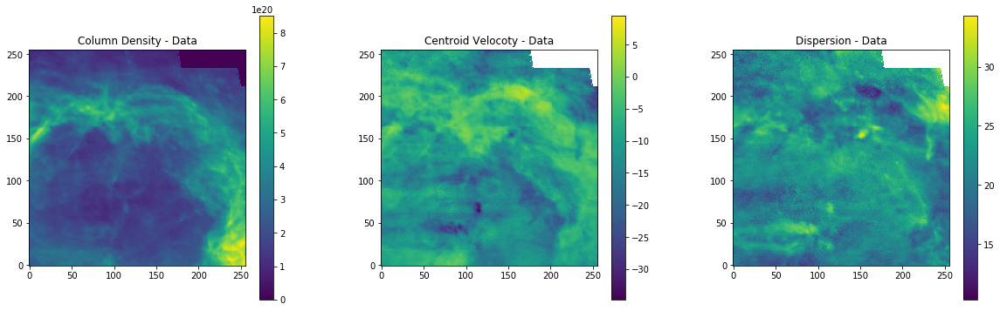

In [42]:
fig = plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
plt.title("Column Density - Data")
plt.imshow(Col_Dens_map, origin="lower") ; plt.colorbar()
plt.subplot(1,3,2)
plt.title("Centroid Velocoty - Data")
plt.imshow(Vel_Cent_map, origin="lower") ; plt.colorbar()
plt.subplot(1,3,3)
plt.title("Dispersion - Data")
plt.imshow(Disp_map, origin="lower") ; plt.colorbar()
plt.subplots_adjust(wspace=0.3)
#fig.savefig("Calculated_Moments_of_the_data_including_ColDens_CentVel_Disp.png", bbox_inches='tight')

### LVC Maps

List of Gaussians used in the LVC phase (in order of average velocity)

In [43]:
print("List of Gaussians used in LVC_CNM:", LVC_CNM_list)
print("List of Gaussians used in LVC_UNM:", LVC_UNM_list)
print("List of Gaussians used in LVC_WNM:", LVC_WNM_list)

List of Gaussians used in LVC_CNM: [16, 17, 21, 29, 31, 32, 34, 36]
List of Gaussians used in LVC_UNM: [13, 15, 18, 19, 20, 22, 23, 24, 25, 26, 28, 30, 33, 35, 37, 39]
List of Gaussians used in LVC_WNM: [12, 14, 27, 38]


In [44]:
Col_Dens_map_LVC_CNM_pix = (1/10**20)*np.sum(model_LVC_CNM_pix, 0)*C*dv
Vel_Cent_map_LVC_CNM_pix = np.tensordot(subvel, model_LVC_CNM_pix, (0,0)) / np.sum(model_LVC_CNM_pix,0)
Disp_map2_LVC_CNM_pix = np.tensordot(subvel**2,model_LVC_CNM_pix, (0,0)) / np.sum(model_LVC_CNM_pix, 0) - Vel_Cent_map_LVC_CNM_pix**2
Disp_map_LVC_CNM_pix = np.sqrt(abs(Disp_map2_LVC_CNM_pix))
Col_Dens_map_LVC_UNM_pix = (1/10**20)*np.sum(model_LVC_UNM_pix, 0)*C*dv
Vel_Cent_map_LVC_UNM_pix = np.tensordot(subvel, model_LVC_UNM_pix, (0,0)) / np.sum(model_LVC_UNM_pix,0)
Disp_map2_LVC_UNM_pix = np.tensordot(subvel**2,model_LVC_UNM_pix, (0,0)) / np.sum(model_LVC_UNM_pix, 0) - Vel_Cent_map_LVC_UNM_pix**2
Disp_map_LVC_UNM_pix = np.sqrt(abs(Disp_map2_LVC_UNM_pix))
Col_Dens_map_LVC_WNM_pix = (1/10**20)*np.sum(model_LVC_WNM_pix, 0)*C*dv
Vel_Cent_map_LVC_WNM_pix = np.tensordot(subvel, model_LVC_WNM_pix, (0,0)) / np.sum(model_LVC_WNM_pix,0)
Disp_map2_LVC_WNM_pix = np.tensordot(subvel**2,model_LVC_WNM_pix, (0,0)) / np.sum(model_LVC_WNM_pix, 0) - Vel_Cent_map_LVC_WNM_pix**2
Disp_map_LVC_WNM_pix = np.sqrt(abs(Disp_map2_LVC_WNM_pix))
Col_Dens_map_LVC_CNM_comp = (1/10**20)*np.sum(model_LVC_CNM_comp, 0)*C*dv
Vel_Cent_map_LVC_CNM_comp = np.tensordot(subvel, model_LVC_CNM_comp, (0,0)) / np.sum(model_LVC_CNM_comp,0)
Disp_map2_LVC_CNM_comp = np.tensordot(subvel**2,model_LVC_CNM_comp, (0,0)) / np.sum(model_LVC_CNM_comp, 0) - Vel_Cent_map_LVC_CNM_comp**2
Disp_map_LVC_CNM_comp = np.sqrt(abs(Disp_map2_LVC_CNM_comp))
Col_Dens_map_LVC_UNM_comp = (1/10**20)*np.sum(model_LVC_UNM_comp, 0)*C*dv
Vel_Cent_map_LVC_UNM_comp = np.tensordot(subvel, model_LVC_UNM_comp, (0,0)) / np.sum(model_LVC_UNM_comp,0)
Disp_map2_LVC_UNM_comp = np.tensordot(subvel**2,model_LVC_UNM_comp, (0,0)) / np.sum(model_LVC_UNM_comp, 0) - Vel_Cent_map_LVC_UNM_comp**2
Disp_map_LVC_UNM_comp = np.sqrt(abs(Disp_map2_LVC_UNM_comp))
Col_Dens_map_LVC_WNM_comp = (1/10**20)*np.sum(model_LVC_WNM_comp, 0)*C*dv
Vel_Cent_map_LVC_WNM_comp = np.tensordot(subvel, model_LVC_WNM_comp, (0,0)) / np.sum(model_LVC_WNM_comp,0)
Disp_map2_LVC_WNM_comp = np.tensordot(subvel**2,model_LVC_WNM_comp, (0,0)) / np.sum(model_LVC_WNM_comp, 0) - Vel_Cent_map_LVC_WNM_comp**2
Disp_map_LVC_WNM_comp = np.sqrt(abs(Disp_map2_LVC_WNM_comp))

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/opt/python/3.7.3

Moment 0: Column Density Maps

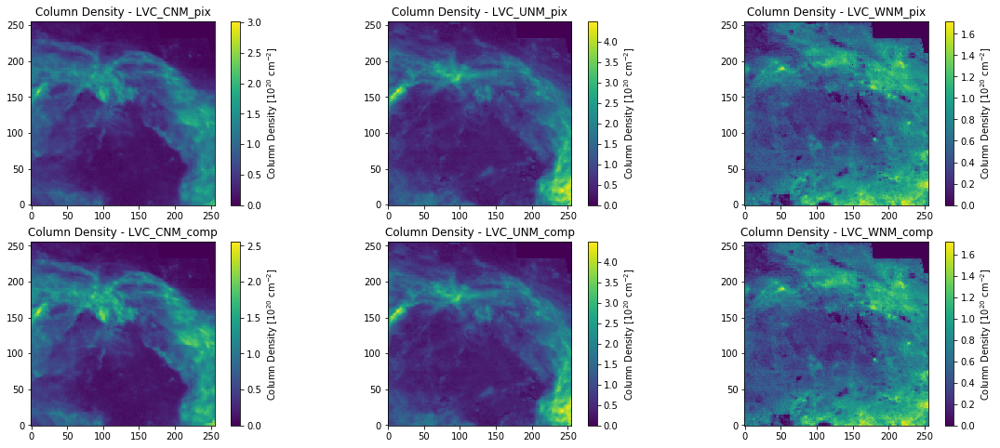

In [45]:
# Plot of the LVC maps (CNM, UNM and WNM)
fig = plt.figure(figsize=(20,8))
plt.subplot(2,3,1) ; plt.title("Column Density - LVC_CNM_pix")
plt.imshow(Col_Dens_map_LVC_CNM_pix, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,2) ; plt.title("Column Density - LVC_UNM_pix")
plt.imshow(Col_Dens_map_LVC_UNM_pix, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,3) ; plt.title("Column Density - LVC_WNM_pix")
plt.imshow(Col_Dens_map_LVC_WNM_pix, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,4) ; plt.title("Column Density - LVC_CNM_comp")
plt.imshow(Col_Dens_map_LVC_CNM_comp, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,5) ; plt.title("Column Density - LVC_UNM_comp")
plt.imshow(Col_Dens_map_LVC_UNM_comp, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,6) ; plt.title("Column Density - LVC_WNM_comp")
plt.imshow(Col_Dens_map_LVC_WNM_comp, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplots_adjust(wspace=0.1)
#fig.savefig("Column_Density_maps_of_LVC.pdf", bbox_inches='tight')

Moment 1: Centroid Velocity Maps

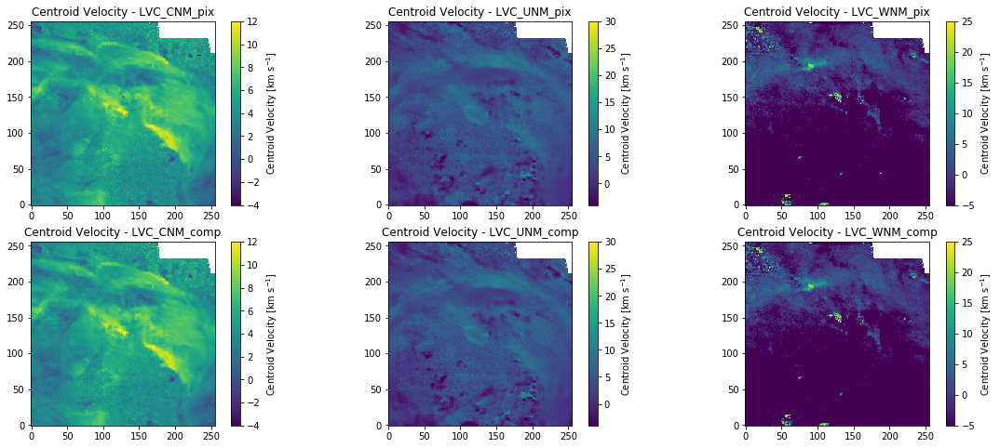

In [46]:
# Plot of the LVC maps (CNM, UNM and WNM)
fig = plt.figure(figsize=(20,8))
plt.subplot(2,3,1) ; plt.title("Centroid Velocity - LVC_CNM_pix")
plt.imshow(Vel_Cent_map_LVC_CNM_pix, origin="lower", vmin=-4,vmax=12) ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,2) ; plt.title("Centroid Velocity - LVC_UNM_pix")
plt.imshow(Vel_Cent_map_LVC_UNM_pix, origin="lower", vmin=-4,vmax=30) ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,3) ; plt.title("Centroid Velocity - LVC_WNM_pix")
plt.imshow(Vel_Cent_map_LVC_WNM_pix, origin="lower", vmin=-5,vmax=25) ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,4) ; plt.title("Centroid Velocity - LVC_CNM_comp")
plt.imshow(Vel_Cent_map_LVC_CNM_comp, origin="lower", vmin=-4,vmax=12) ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,5) ; plt.title("Centroid Velocity - LVC_UNM_comp")
plt.imshow(Vel_Cent_map_LVC_UNM_comp, origin="lower", vmin=-4,vmax=30) ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,6) ; plt.title("Centroid Velocity - LVC_WNM_comp")
plt.imshow(Vel_Cent_map_LVC_WNM_comp, origin="lower", vmin=-5,vmax=25) ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplots_adjust(wspace=0.1)
#fig.savefig("Column_Density_maps_of_LVC.png", bbox_inches='tight')

Moment 2: Dispersion Maps

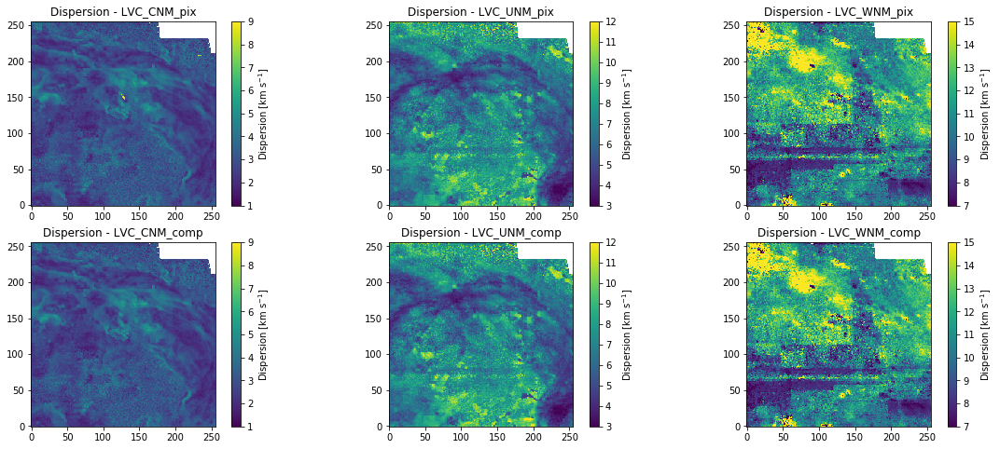

In [47]:
# Plot of the LVC maps (CNM, UNM and WNM)
fig = plt.figure(figsize=(20,8))
plt.subplot(2,3,1) ; plt.title("Dispersion - LVC_CNM_pix")
plt.imshow(Disp_map_LVC_CNM_pix, origin="lower", vmin=1, vmax=9) ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,2) ; plt.title("Dispersion - LVC_UNM_pix")
plt.imshow(Disp_map_LVC_UNM_pix, origin="lower", vmin=3, vmax=12) ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,3) ; plt.title("Dispersion - LVC_WNM_pix")
plt.imshow(Disp_map_LVC_WNM_pix, origin="lower", vmin=7, vmax=15) ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,4) ; plt.title("Dispersion - LVC_CNM_comp")
plt.imshow(Disp_map_LVC_CNM_comp, origin="lower", vmin=1, vmax=9) ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,5) ; plt.title("Dispersion - LVC_UNM_comp")
plt.imshow(Disp_map_LVC_UNM_comp, origin="lower", vmin=3, vmax=12) ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,6) ; plt.title("Dispersion - LVC_WNM_comp")
plt.imshow(Disp_map_LVC_WNM_comp, origin="lower", vmin=7, vmax=15) ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplots_adjust(wspace=0.1)
#fig.savefig("Column_Density_maps_of_LVC.png", bbox_inches='tight')

### IVC1 maps

List of Gaussians used in the IVC1 phase (in order of average velocity)

In [48]:
print("List of Gaussians used in IVC1_CNM:", IVC1_CNM_list)
print("List of Gaussians used in IVC1_UNM:", IVC1_UNM_list)
print("List of Gaussians used in IVC1_WNM:", IVC1_WNM_list)

List of Gaussians used in IVC1_CNM: []
List of Gaussians used in IVC1_UNM: [9, 10, 11]
List of Gaussians used in IVC1_WNM: []


In [49]:
Col_Dens_map_IVC1_CNM_pix = (1/10**20)*np.sum(model_IVC1_CNM_pix, 0)*C*dv
Vel_Cent_map_IVC1_CNM_pix = np.tensordot(subvel, model_IVC1_CNM_pix, (0,0)) / np.sum(model_IVC1_CNM_pix,0)
Disp_map2_IVC1_CNM_pix = np.tensordot(subvel**2,model_IVC1_CNM_pix, (0,0)) / np.sum(model_IVC1_CNM_pix, 0) - Vel_Cent_map_IVC1_CNM_pix**2
Disp_map_IVC1_CNM_pix = np.sqrt(abs(Disp_map2_IVC1_CNM_pix))
Col_Dens_map_IVC1_UNM_pix = (1/10**20)*np.sum(model_IVC1_UNM_pix, 0)*C*dv
Vel_Cent_map_IVC1_UNM_pix = np.tensordot(subvel, model_IVC1_UNM_pix, (0,0)) / np.sum(model_IVC1_UNM_pix,0)
Disp_map2_IVC1_UNM_pix = np.tensordot(subvel**2,model_IVC1_UNM_pix, (0,0)) / np.sum(model_IVC1_UNM_pix, 0) - Vel_Cent_map_IVC1_UNM_pix**2
Disp_map_IVC1_UNM_pix = np.sqrt(abs(Disp_map2_IVC1_UNM_pix))
Col_Dens_map_IVC1_WNM_pix = (1/10**20)*np.sum(model_IVC1_WNM_pix, 0)*C*dv
Vel_Cent_map_IVC1_WNM_pix = np.tensordot(subvel, model_IVC1_WNM_pix, (0,0)) / np.sum(model_IVC1_WNM_pix,0)
Disp_map2_IVC1_WNM_pix = np.tensordot(subvel**2,model_IVC1_WNM_pix, (0,0)) / np.sum(model_IVC1_WNM_pix, 0) - Vel_Cent_map_IVC1_WNM_pix**2
Disp_map_IVC1_WNM_pix = np.sqrt(abs(Disp_map2_IVC1_WNM_pix))
Col_Dens_map_IVC1_CNM_comp = (1/10**20)*np.sum(model_IVC1_CNM_comp, 0)*C*dv
Vel_Cent_map_IVC1_CNM_comp = np.tensordot(subvel, model_IVC1_CNM_comp, (0,0)) / np.sum(model_IVC1_CNM_comp,0)
Disp_map2_IVC1_CNM_comp = np.tensordot(subvel**2,model_IVC1_CNM_comp, (0,0)) / np.sum(model_IVC1_CNM_comp, 0) - Vel_Cent_map_IVC1_CNM_comp**2
Disp_map_IVC1_CNM_comp = np.sqrt(abs(Disp_map2_IVC1_CNM_comp))
Col_Dens_map_IVC1_UNM_comp = (1/10**20)*np.sum(model_IVC1_UNM_comp, 0)*C*dv
Vel_Cent_map_IVC1_UNM_comp = np.tensordot(subvel, model_IVC1_UNM_comp, (0,0)) / np.sum(model_IVC1_UNM_comp,0)
Disp_map2_IVC1_UNM_comp = np.tensordot(subvel**2,model_IVC1_UNM_comp, (0,0)) / np.sum(model_IVC1_UNM_comp, 0) - Vel_Cent_map_IVC1_UNM_comp**2
Disp_map_IVC1_UNM_comp = np.sqrt(abs(Disp_map2_IVC1_UNM_comp))
Col_Dens_map_IVC1_WNM_comp = (1/10**20)*np.sum(model_IVC1_WNM_comp, 0)*C*dv
Vel_Cent_map_IVC1_WNM_comp = np.tensordot(subvel, model_IVC1_WNM_comp, (0,0)) / np.sum(model_IVC1_WNM_comp,0)
Disp_map2_IVC1_WNM_comp = np.tensordot(subvel**2,model_IVC1_WNM_comp, (0,0)) / np.sum(model_IVC1_WNM_comp, 0) - Vel_Cent_map_IVC1_WNM_comp**2
Disp_map_IVC1_WNM_comp = np.sqrt(abs(Disp_map2_IVC1_WNM_comp))

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/opt/python/3.7.3

Moment 0: Column Density Maps

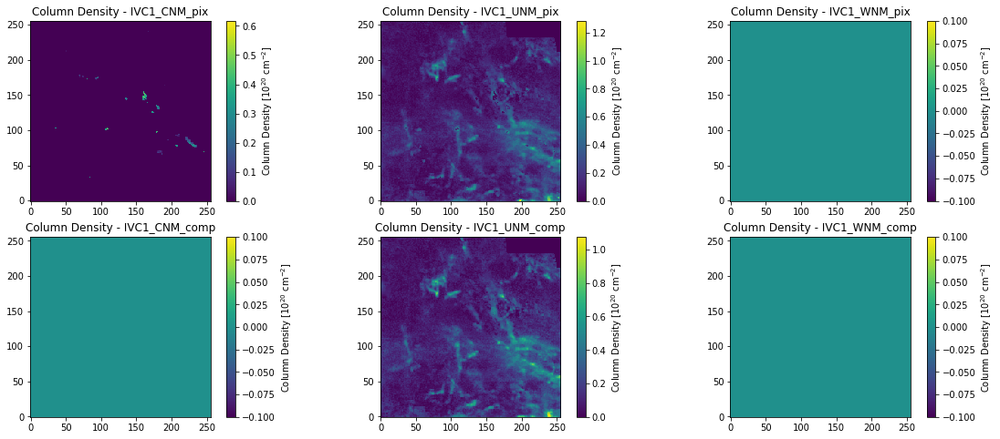

In [50]:
# Plot of the IVC1 maps (CNM, UNM and WNM)
fig = plt.figure(figsize=(20,8))
plt.subplot(2,3,1) ; plt.title("Column Density - IVC1_CNM_pix")
plt.imshow(Col_Dens_map_IVC1_CNM_pix, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,2) ; plt.title("Column Density - IVC1_UNM_pix")
plt.imshow(Col_Dens_map_IVC1_UNM_pix, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,3) ; plt.title("Column Density - IVC1_WNM_pix")
plt.imshow(Col_Dens_map_IVC1_WNM_pix, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,4) ; plt.title("Column Density - IVC1_CNM_comp")
plt.imshow(Col_Dens_map_IVC1_CNM_comp, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,5) ; plt.title("Column Density - IVC1_UNM_comp")
plt.imshow(Col_Dens_map_IVC1_UNM_comp, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,6) ; plt.title("Column Density - IVC1_WNM_comp")
plt.imshow(Col_Dens_map_IVC1_WNM_comp, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplots_adjust(wspace=0.1)
#fig.savefig("Column_Density_maps_of_IVC1.pdf", bbox_inches='tight')

Moment 1: Centroid Velocity Maps

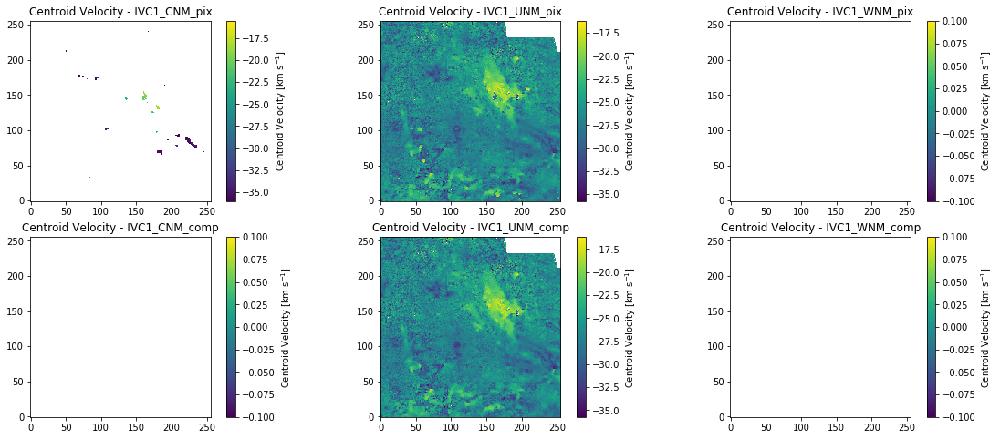

In [51]:
# Plot of the IVC1 maps (CNM, UNM and WNM)
fig = plt.figure(figsize=(20,8))
plt.subplot(2,3,1) ; plt.title("Centroid Velocity - IVC1_CNM_pix")
plt.imshow(Vel_Cent_map_IVC1_CNM_pix, origin="lower") ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,2) ; plt.title("Centroid Velocity - IVC1_UNM_pix")
plt.imshow(Vel_Cent_map_IVC1_UNM_pix, origin="lower") ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,3) ; plt.title("Centroid Velocity - IVC1_WNM_pix")
plt.imshow(Vel_Cent_map_IVC1_WNM_pix, origin="lower") ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,4) ; plt.title("Centroid Velocity - IVC1_CNM_comp")
plt.imshow(Vel_Cent_map_IVC1_CNM_comp, origin="lower") ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,5) ; plt.title("Centroid Velocity - IVC1_UNM_comp")
plt.imshow(Vel_Cent_map_IVC1_UNM_comp, origin="lower") ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,6) ; plt.title("Centroid Velocity - IVC1_WNM_comp")
plt.imshow(Vel_Cent_map_IVC1_WNM_comp, origin="lower") ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplots_adjust(wspace=0.1)
#fig.savefig("Column_Density_maps_of_IVC1.png", bbox_inches='tight')

Moment 2: Dispersion Maps

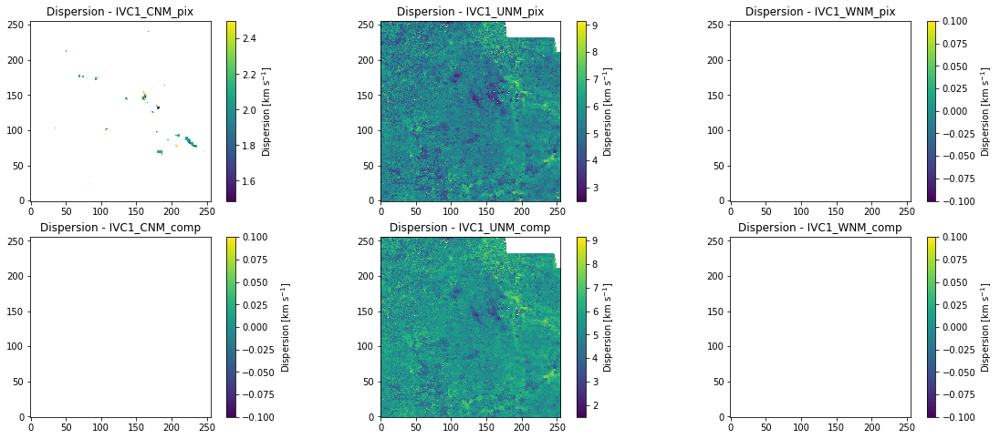

In [52]:
# Plot of the IVC1 maps (CNM, UNM and WNM)
fig = plt.figure(figsize=(20,8))
plt.subplot(2,3,1) ; plt.title("Dispersion - IVC1_CNM_pix")
plt.imshow(Disp_map_IVC1_CNM_pix, origin="lower") ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,2) ; plt.title("Dispersion - IVC1_UNM_pix")
plt.imshow(Disp_map_IVC1_UNM_pix, origin="lower") ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,3) ; plt.title("Dispersion - IVC1_WNM_pix")
plt.imshow(Disp_map_IVC1_WNM_pix, origin="lower") ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,4) ; plt.title("Dispersion - IVC1_CNM_comp")
plt.imshow(Disp_map_IVC1_CNM_comp, origin="lower") ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,5) ; plt.title("Dispersion - IVC1_UNM_comp")
plt.imshow(Disp_map_IVC1_UNM_comp, origin="lower") ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,6) ; plt.title("Dispersion - IVC1_WNM_comp")
plt.imshow(Disp_map_IVC1_WNM_comp, origin="lower") ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplots_adjust(wspace=0.1)
#fig.savefig("Column_Density_maps_of_IVC1.png", bbox_inches='tight')

### IVC2 Maps

List of Gaussians used in the IVC2 phase (in order of average velocity)

In [53]:
print("List of Gaussians used in IVC2_CNM:", IVC2_CNM_list)
print("List of Gaussians used in IVC2_UNM:", IVC2_UNM_list)
print("List of Gaussians used in IVC2_WNM:", IVC2_WNM_list)

List of Gaussians used in IVC2_CNM: [6]
List of Gaussians used in IVC2_UNM: [1, 2, 3, 5, 7, 8]
List of Gaussians used in IVC2_WNM: [0, 4]


In [54]:
Col_Dens_map_IVC2_CNM_pix = (1/10**20)*np.sum(model_IVC2_CNM_pix, 0)*C*dv
Vel_Cent_map_IVC2_CNM_pix = np.tensordot(subvel, model_IVC2_CNM_pix, (0,0)) / np.sum(model_IVC2_CNM_pix,0)
Disp_map2_IVC2_CNM_pix = np.tensordot(subvel**2,model_IVC2_CNM_pix, (0,0)) / np.sum(model_IVC2_CNM_pix, 0) - Vel_Cent_map_IVC2_CNM_pix**2
Disp_map_IVC2_CNM_pix = np.sqrt(abs(Disp_map2_IVC2_CNM_pix))
Col_Dens_map_IVC2_UNM_pix = (1/10**20)*np.sum(model_IVC2_UNM_pix, 0)*C*dv
Vel_Cent_map_IVC2_UNM_pix = np.tensordot(subvel, model_IVC2_UNM_pix, (0,0)) / np.sum(model_IVC2_UNM_pix,0)
Disp_map2_IVC2_UNM_pix = np.tensordot(subvel**2,model_IVC2_UNM_pix, (0,0)) / np.sum(model_IVC2_UNM_pix, 0) - Vel_Cent_map_IVC2_UNM_pix**2
Disp_map_IVC2_UNM_pix = np.sqrt(abs(Disp_map2_IVC2_UNM_pix))
Col_Dens_map_IVC2_WNM_pix = (1/10**20)*np.sum(model_IVC2_WNM_pix, 0)*C*dv
Vel_Cent_map_IVC2_WNM_pix = np.tensordot(subvel, model_IVC2_WNM_pix, (0,0)) / np.sum(model_IVC2_WNM_pix,0)
Disp_map2_IVC2_WNM_pix = np.tensordot(subvel**2,model_IVC2_WNM_pix, (0,0)) / np.sum(model_IVC2_WNM_pix, 0) - Vel_Cent_map_IVC2_WNM_pix**2
Disp_map_IVC2_WNM_pix = np.sqrt(abs(Disp_map2_IVC2_WNM_pix))
Col_Dens_map_IVC2_CNM_comp = (1/10**20)*np.sum(model_IVC2_CNM_comp, 0)*C*dv
Vel_Cent_map_IVC2_CNM_comp = np.tensordot(subvel, model_IVC2_CNM_comp, (0,0)) / np.sum(model_IVC2_CNM_comp,0)
Disp_map2_IVC2_CNM_comp = np.tensordot(subvel**2,model_IVC2_CNM_comp, (0,0)) / np.sum(model_IVC2_CNM_comp, 0) - Vel_Cent_map_IVC2_CNM_comp**2
Disp_map_IVC2_CNM_comp = np.sqrt(abs(Disp_map2_IVC2_CNM_comp))
Col_Dens_map_IVC2_UNM_comp = (1/10**20)*np.sum(model_IVC2_UNM_comp, 0)*C*dv
Vel_Cent_map_IVC2_UNM_comp = np.tensordot(subvel, model_IVC2_UNM_comp, (0,0)) / np.sum(model_IVC2_UNM_comp,0)
Disp_map2_IVC2_UNM_comp = np.tensordot(subvel**2,model_IVC2_UNM_comp, (0,0)) / np.sum(model_IVC2_UNM_comp, 0) - Vel_Cent_map_IVC2_UNM_comp**2
Disp_map_IVC2_UNM_comp = np.sqrt(abs(Disp_map2_IVC2_UNM_comp))
Col_Dens_map_IVC2_WNM_comp = (1/10**20)*np.sum(model_IVC2_WNM_comp, 0)*C*dv
Vel_Cent_map_IVC2_WNM_comp = np.tensordot(subvel, model_IVC2_WNM_comp, (0,0)) / np.sum(model_IVC2_WNM_comp,0)
Disp_map2_IVC2_WNM_comp = np.tensordot(subvel**2,model_IVC2_WNM_comp, (0,0)) / np.sum(model_IVC2_WNM_comp, 0) - Vel_Cent_map_IVC2_WNM_comp**2
Disp_map_IVC2_WNM_comp = np.sqrt(abs(Disp_map2_IVC2_WNM_comp))

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/opt/python/3.7.3

Moment 0: Column Density Maps

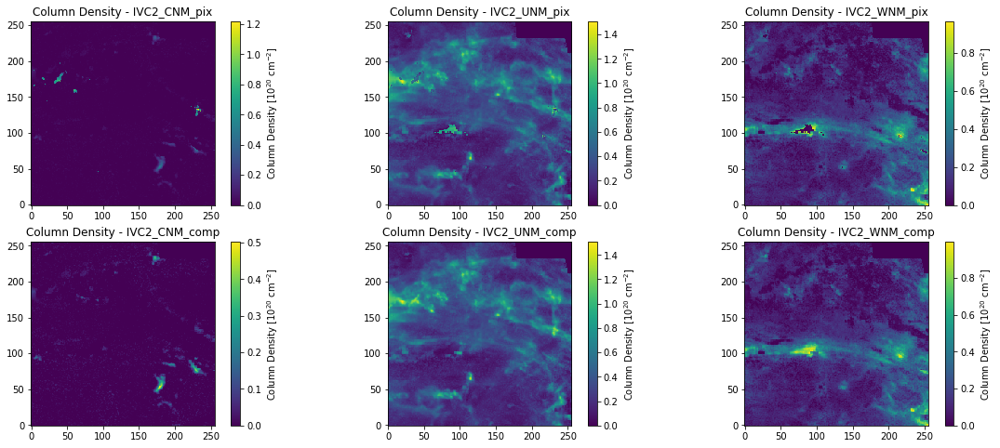

In [55]:
# Plot of the IVC2 maps (CNM, UNM and WNM)
fig = plt.figure(figsize=(20,8))
plt.subplot(2,3,1) ; plt.title("Column Density - IVC2_CNM_pix")
plt.imshow(Col_Dens_map_IVC2_CNM_pix, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,2) ; plt.title("Column Density - IVC2_UNM_pix")
plt.imshow(Col_Dens_map_IVC2_UNM_pix, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,3) ; plt.title("Column Density - IVC2_WNM_pix")
plt.imshow(Col_Dens_map_IVC2_WNM_pix, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,4) ; plt.title("Column Density - IVC2_CNM_comp")
plt.imshow(Col_Dens_map_IVC2_CNM_comp, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,5) ; plt.title("Column Density - IVC2_UNM_comp")
plt.imshow(Col_Dens_map_IVC2_UNM_comp, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplot(2,3,6) ; plt.title("Column Density - IVC2_WNM_comp")
plt.imshow(Col_Dens_map_IVC2_WNM_comp, origin="lower") ; plt.colorbar(label="Column Density [10$^{20}$ cm$^{-2}$]")
plt.subplots_adjust(wspace=0.1)
#fig.savefig("Column_Density_maps_of_IVC2.pdf", bbox_inches='tight')

Moment 1: Centroid Velocity Maps

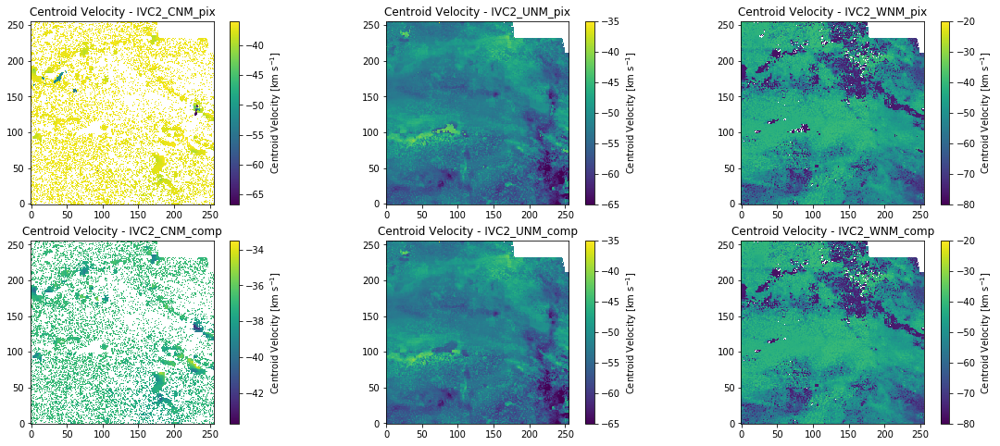

In [56]:
# Plot of the IVC2 maps (CNM, UNM and WNM)
fig = plt.figure(figsize=(20,8))
plt.subplot(2,3,1) ; plt.title("Centroid Velocity - IVC2_CNM_pix")
plt.imshow(Vel_Cent_map_IVC2_CNM_pix, origin="lower") ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,2) ; plt.title("Centroid Velocity - IVC2_UNM_pix")
plt.imshow(Vel_Cent_map_IVC2_UNM_pix, origin="lower", vmin=-65, vmax=-35) ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,3) ; plt.title("Centroid Velocity - IVC2_WNM_pix")
plt.imshow(Vel_Cent_map_IVC2_WNM_pix, origin="lower", vmin=-80, vmax=-20) ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,4) ; plt.title("Centroid Velocity - IVC2_CNM_comp")
plt.imshow(Vel_Cent_map_IVC2_CNM_comp, origin="lower") ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,5) ; plt.title("Centroid Velocity - IVC2_UNM_comp")
plt.imshow(Vel_Cent_map_IVC2_UNM_comp, origin="lower", vmin=-65, vmax=-35) ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplot(2,3,6) ; plt.title("Centroid Velocity - IVC2_WNM_comp")
plt.imshow(Vel_Cent_map_IVC2_WNM_comp, origin="lower", vmin=-80, vmax=-20) ; plt.colorbar(label="Centroid Velocity [km s$^{-1}$]")
plt.subplots_adjust(wspace=0.1)
#fig.savefig("Column_Density_maps_of_IVC2.png", bbox_inches='tight')

Moment 2 : Dispersion Maps

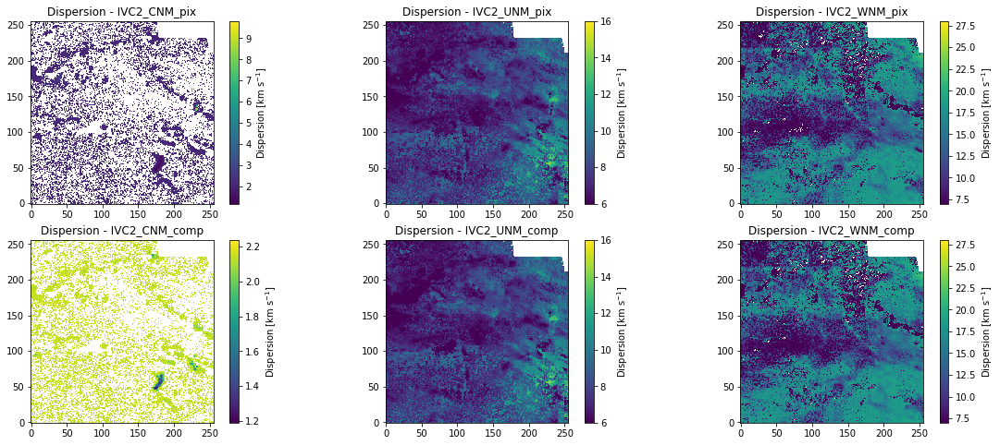

In [57]:
# Plot of the IVC2 maps (CNM, UNM and WNM)
fig = plt.figure(figsize=(20,8))
plt.subplot(2,3,1) ; plt.title("Dispersion - IVC2_CNM_pix")
plt.imshow(Disp_map_IVC2_CNM_pix, origin="lower") ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,2) ; plt.title("Dispersion - IVC2_UNM_pix")
plt.imshow(Disp_map_IVC2_UNM_pix, origin="lower", vmin=6, vmax=16) ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,3) ; plt.title("Dispersion - IVC2_WNM_pix")
plt.imshow(Disp_map_IVC2_WNM_pix, origin="lower", vmin=7, vmax=28) ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,4) ; plt.title("Dispersion - IVC2_CNM_comp")
plt.imshow(Disp_map_IVC2_CNM_comp, origin="lower") ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,5) ; plt.title("Dispersion - IVC2_UNM_comp")
plt.imshow(Disp_map_IVC2_UNM_comp, origin="lower", vmin=6, vmax=16) ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplot(2,3,6) ; plt.title("Dispersion - IVC2_WNM_comp")
plt.imshow(Disp_map_IVC2_WNM_comp, origin="lower", vmin=7, vmax=28) ; plt.colorbar(label="Dispersion [km s$^{-1}$]")
plt.subplots_adjust(wspace=0.1)
#fig.savefig("Column_Density_maps_of_IVC2.png", bbox_inches='tight')

## Column Density Maps

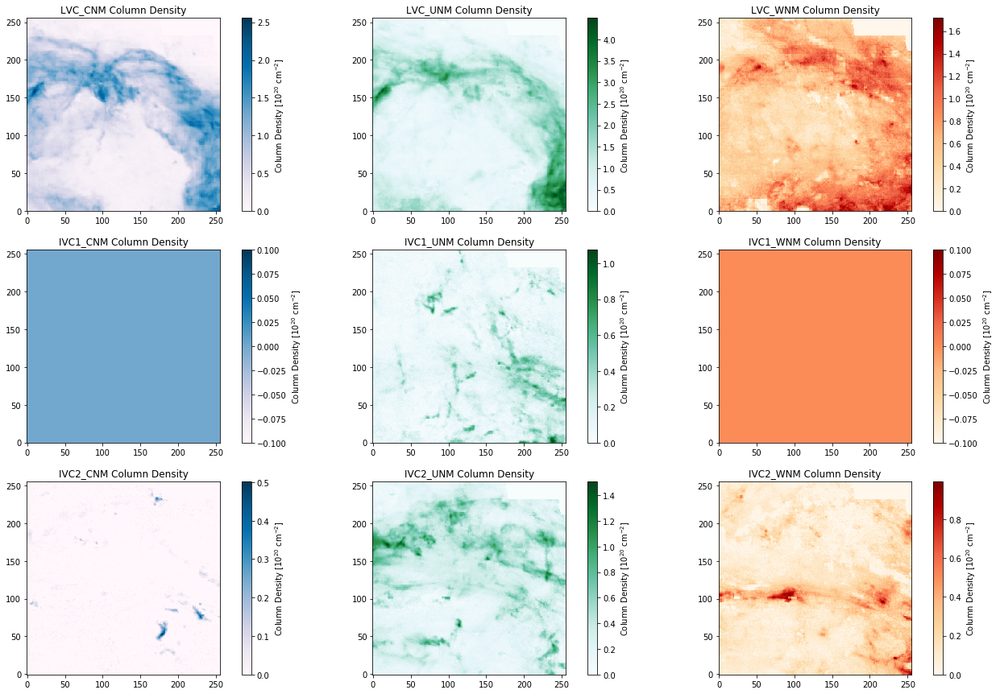

In [58]:
fig = plt.figure(figsize=(25,15))
plt.subplot(3,3,1)
plt.title("LVC_CNM Column Density")
plt.imshow(Col_Dens_map_LVC_CNM_comp, origin="lower", cmap="PuBu") ; plt.colorbar(label=r'Column Density [10$^{20}$ cm$^{-2}$]')
plt.subplot(3,3,2)
plt.title("LVC_UNM Column Density")
plt.imshow(Col_Dens_map_LVC_UNM_comp, origin="lower", cmap="BuGn") ; plt.colorbar(label=r'Column Density [10$^{20}$ cm$^{-2}$]')
plt.subplot(3,3,3)
plt.title("LVC_WNM Column Density")
plt.imshow(Col_Dens_map_LVC_WNM_comp, origin="lower", cmap="OrRd") ; plt.colorbar(label=r'Column Density [10$^{20}$ cm$^{-2}$]')
plt.subplot(3,3,4)
plt.title("IVC1_CNM Column Density")
plt.imshow(Col_Dens_map_IVC1_CNM_comp, origin="lower", cmap="PuBu") ; plt.colorbar(label=r'Column Density [10$^{20}$ cm$^{-2}$]')
plt.subplot(3,3,5)
plt.title("IVC1_UNM Column Density")
plt.imshow(Col_Dens_map_IVC1_UNM_comp, origin="lower", cmap="BuGn") ; plt.colorbar(label=r'Column Density [10$^{20}$ cm$^{-2}$]')
plt.subplot(3,3,6)
plt.title("IVC1_WNM Column Density")
plt.imshow(Col_Dens_map_IVC1_WNM_comp, origin="lower", cmap="OrRd") ; plt.colorbar(label=r'Column Density [10$^{20}$ cm$^{-2}$]')
plt.subplot(3,3,7)
plt.title("IVC2_CNM Column Density")
plt.imshow(Col_Dens_map_IVC2_CNM_comp, origin="lower", cmap="PuBu") ; plt.colorbar(label=r'Column Density [10$^{20}$ cm$^{-2}$]')
plt.subplot(3,3,8)
plt.title("IVC2_UNM Column Density")
plt.imshow(Col_Dens_map_IVC2_UNM_comp, origin="lower", cmap="BuGn") ; plt.colorbar(label=r'Column Density [10$^{20}$ cm$^{-2}$]')
plt.subplot(3,3,9)
plt.title("IVC2_WNM Column Density")
plt.imshow(Col_Dens_map_IVC2_WNM_comp, origin="lower", cmap="OrRd") ; plt.colorbar(label=r'Column Density [10$^{20}$ cm$^{-2}$]')
plt.subplots_adjust(wspace=-0.2, hspace=0.2)
#fig.savefig("Column_Density_Maps_of_Phases_comp_RGB.pdf", bbox_inches="tight")

## Looking at the Mean and Standard Deviation Spectra

Here, we can look at the different spectra of the data or the model to identify interesting regions along the velocity axis. By looking at these, we can see if any of the boundaries need to change based on any peaks we see and their positions.

In [59]:
UNM_cube = model_LVC_UNM_comp + model_IVC1_UNM_comp + model_IVC2_UNM_comp
CNM_cube = model_LVC_CNM_comp + model_IVC1_CNM_comp + model_IVC2_CNM_comp
WNM_cube = model_LVC_WNM_comp + model_IVC1_WNM_comp + model_IVC2_WNM_comp

avg_spec = np.mean(CNM_cube, (1,2)) 
med_spec = np.median(CNM_cube, (1,2))
std_spec_CNM = np.std(CNM_cube, (1,2))
std_spec_UNM = np.std(UNM_cube, (1,2))
std_spec_WNM = np.std(WNM_cube, (1,2))
std_spec_data = np.std(subcube, (1,2))
rms_spec = np.sqrt(avg_spec**2 + std_spec_data**2)

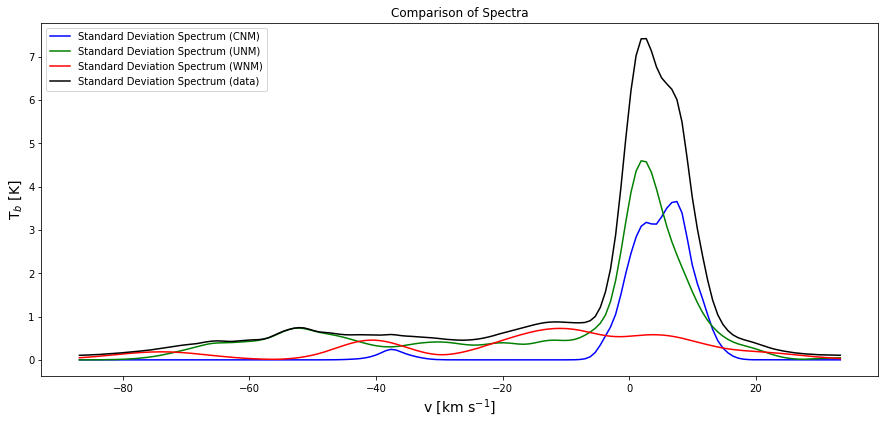

In [60]:
fig = plt.figure(figsize=(15,6.5))
plt.title("Comparison of Spectra")
plt.xlabel(r'v [km s$^{-1}$]', fontsize=14)
plt.ylabel(r'T$_{b}$ [K]' , fontsize=14)
#plt.plot(subvel,avg_spec, 'r-', label="Average Spectrum")
#plt.plot(subvel,med_spec, 'b-', label="Median Spectrum")
plt.plot(subvel,std_spec_CNM, 'b-', label="Standard Deviation Spectrum (CNM)")
plt.plot(subvel,std_spec_UNM, 'g-', label="Standard Deviation Spectrum (UNM)")
plt.plot(subvel,std_spec_WNM, 'r-', label="Standard Deviation Spectrum (WNM)")
plt.plot(subvel,std_spec_data, 'k-', label="Standard Deviation Spectrum (data)")
#plt.plot(subvel,rms_spec, 'y' , label="RMS Spectrum")
plt.legend(loc="upper left")
plt.show()
#fig.savefig("Standard_Deviation_Spectra_comparison_of_phases.pdf", bbox_inches='tight')

## Plot of the mass fractions of the phases

In [61]:
model_LVC = model_LVC_CNM_comp + model_LVC_UNM_comp + model_LVC_WNM_comp
model_IVC1 = model_IVC1_CNM_comp + model_IVC1_UNM_comp + model_IVC1_WNM_comp
model_IVC2 = model_IVC2_CNM_comp + model_IVC2_UNM_comp + model_IVC2_WNM_comp

In [62]:
NH_mass_frac_LVC_CNM = np.sum(model_LVC_CNM_comp, 0) / np.sum(model_LVC, 0)
NH_mass_frac_LVC_UNM = np.sum(model_LVC_UNM_comp, 0) / np.sum(model_LVC, 0)
NH_mass_frac_LVC_WNM = np.sum(model_LVC_WNM_comp, 0) / np.sum(model_LVC, 0)
NH_mass_frac_IVC1_CNM = np.sum(model_IVC1_CNM_comp, 0) / np.sum(model_IVC1, 0)
NH_mass_frac_IVC1_UNM = np.sum(model_IVC1_UNM_comp, 0) / np.sum(model_IVC1, 0)
NH_mass_frac_IVC1_WNM = np.sum(model_IVC1_WNM_comp, 0) / np.sum(model_IVC1, 0)
NH_mass_frac_IVC2_CNM = np.sum(model_IVC2_CNM_comp, 0) / np.sum(model_IVC2, 0)
NH_mass_frac_IVC2_UNM = np.sum(model_IVC2_UNM_comp, 0) / np.sum(model_IVC2, 0)
NH_mass_frac_IVC2_WNM = np.sum(model_IVC2_WNM_comp, 0) / np.sum(model_IVC2, 0)

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/python/3.7.3/lib/python3.7/site-packages/ip

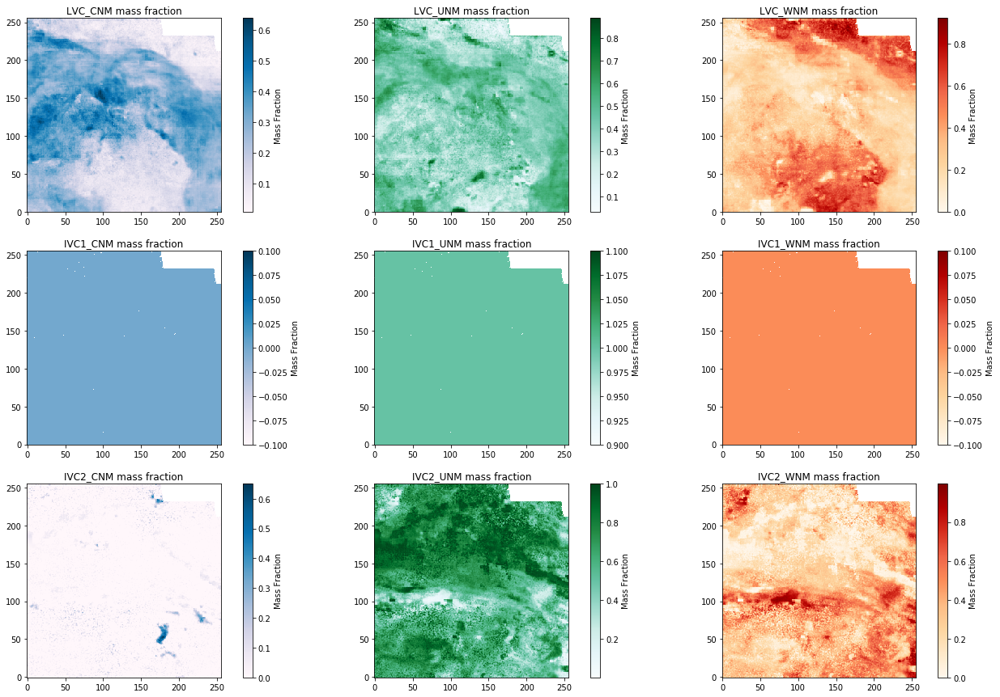

In [63]:
fig = plt.figure(figsize=(25,15))
plt.subplot(3,3,1)
plt.title("LVC_CNM mass fraction")
plt.imshow(NH_mass_frac_LVC_CNM, origin="lower", cmap="PuBu") ; plt.colorbar(label="Mass Fraction")
plt.subplot(3,3,2)
plt.title("LVC_UNM mass fraction")
plt.imshow(NH_mass_frac_LVC_UNM, origin="lower", cmap="BuGn") ; plt.colorbar(label="Mass Fraction")
plt.subplot(3,3,3)
plt.title("LVC_WNM mass fraction")
plt.imshow(NH_mass_frac_LVC_WNM, origin="lower", cmap="OrRd") ; plt.colorbar(label="Mass Fraction")
plt.subplot(3,3,4)
plt.title("IVC1_CNM mass fraction")
plt.imshow(NH_mass_frac_IVC1_CNM, origin="lower", cmap="PuBu") ; plt.colorbar(label="Mass Fraction")
plt.subplot(3,3,5)
plt.title("IVC1_UNM mass fraction")
plt.imshow(NH_mass_frac_IVC1_UNM, origin="lower", cmap="BuGn") ; plt.colorbar(label="Mass Fraction")
plt.subplot(3,3,6)
plt.title("IVC1_WNM mass fraction")
plt.imshow(NH_mass_frac_IVC1_WNM, origin="lower", cmap="OrRd") ; plt.colorbar(label="Mass Fraction")
plt.subplot(3,3,7)
plt.title("IVC2_CNM mass fraction")
plt.imshow(NH_mass_frac_IVC2_CNM, origin="lower", cmap="PuBu") ; plt.colorbar(label="Mass Fraction")
plt.subplot(3,3,8)
plt.title("IVC2_UNM mass fraction")
plt.imshow(NH_mass_frac_IVC2_UNM, origin="lower", cmap="BuGn") ; plt.colorbar(label="Mass Fraction")
plt.subplot(3,3,9)
plt.title("IVC2_WNM mass fraction")
plt.imshow(NH_mass_frac_IVC2_WNM, origin="lower", cmap="OrRd") ; plt.colorbar(label="Mass Fraction")

plt.subplots_adjust(wspace=-0.2, hspace=0.2)
#fig.savefig("Mass_fraction_comparison_of_phases_RGB.png", bbox_inches="tight")

In [64]:
LVC_mass_frac = np.sum(model_LVC, 0) / np.sum(model, 0)
IVC1_mass_frac = np.sum(model_IVC1, 0) / np.sum(model, 0)
IVC2_mass_frac = np.sum(model_IVC2, 0) / np.sum(model, 0)

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


Mean of LVC Mass Fraction =  0.7467025987458886
Mean of IVC1 Mass Fraction =  0.05856759253178365
Mean of IVC2 Mass Fraction =  0.19472980872232762


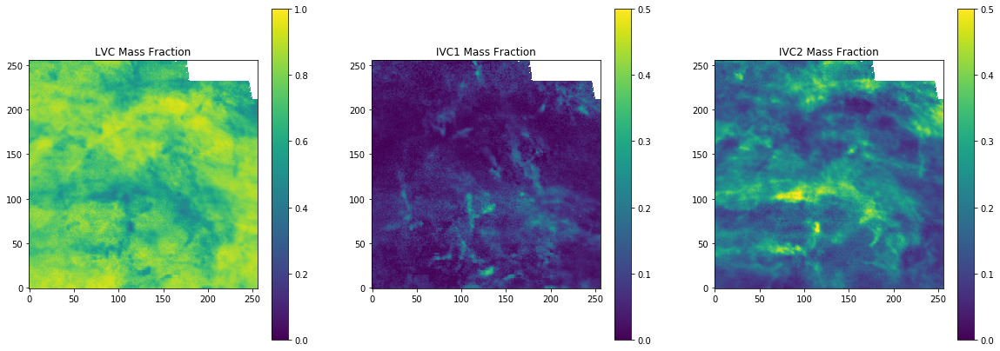

In [65]:
fig = plt.figure(figsize=(20,7))
plt.subplot(1,3,1) ; plt.title("LVC Mass Fraction")
plt.imshow(LVC_mass_frac, origin='lower', vmin=0, vmax=1) ; plt.colorbar()
plt.subplot(1,3,2) ; plt.title("IVC1 Mass Fraction")
plt.imshow(IVC1_mass_frac, origin='lower', vmin=0, vmax=0.5) ; plt.colorbar()
plt.subplot(1,3,3) ; plt.title("IVC2 Mass Fraction")
plt.imshow(IVC2_mass_frac, origin='lower', vmin=0, vmax=0.5) ; plt.colorbar()
print("Mean of LVC Mass Fraction = ", np.nanmean(LVC_mass_frac))
print("Mean of IVC1 Mass Fraction = ", np.nanmean(IVC1_mass_frac))
print("Mean of IVC2 Mass Fraction = ", np.nanmean(IVC2_mass_frac))
fig.savefig("Mass_Fraction_of_LVC_IVCs.pdf", bbox_inches="tight")

## Plot mosaics of the maps (column density, velocity, and dispersion)

Column Density maps:

<Figure size 432x288 with 0 Axes>

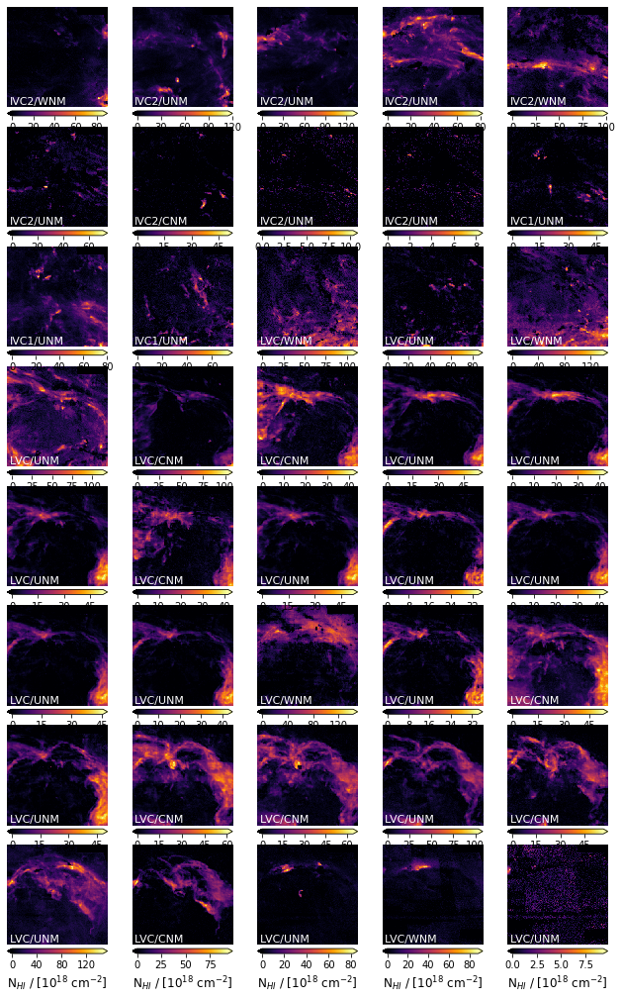

In [66]:
def cm2inch(*tupl):
        inch = 2.54
        if isinstance(tupl[0], tuple):
            return tuple(i/inch for i in tupl[0])
        else:
            return tuple(i/inch for i in tupl)
fig = plt.figure() 
#Plot mosaic field                                                                                                                                                                                                                                                                                                         
lh = 8; lw = 5
fig, axs = plt.subplots(lh, lw, sharex=True, sharey=True, figsize=(cm2inch((22.,35.5))))
fig.subplots_adjust(top=1., bottom=0.05, left=0., right=1., hspace=0.1, wspace=0.075)
k = 0
for i in np.arange(lh):
    for j in np.arange(lw):
        im = axs[i][j].imshow(field[k]/10**18, origin="lower", cmap="inferno")
        color = "white"
        if np.mean(sigfield[k]) <= CNM_UNM_LVC_bound:
            if np.mean(vfield[k]) >= LVC_IVC1_bound_CNM_UNM:
                axs[i][j].text(5,5,"LVC/CNM", color=color, size=11.)
        if np.mean(sigfield[k]) <= CNM_UNM_IVC1_2_bound:
            if np.mean(vfield[k]) < LVC_IVC1_bound_CNM_UNM and np.mean(vfield[k]) >= IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC1/CNM", color=color, size=11.)
            if np.mean(vfield[k]) < IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC2/CNM", color=color, size=11.)
        if np.mean(sigfield[k]) > CNM_UNM_LVC_bound and np.mean(sigfield[k]) <= UNM_WNM_bound:
            if np.mean(vfield[k]) >= LVC_IVC1_bound_CNM_UNM:
                axs[i][j].text(5,5,"LVC/UNM", color=color, size=11.)
        if np.mean(sigfield[k]) > CNM_UNM_IVC1_2_bound and np.mean(sigfield[k]) <= UNM_WNM_bound:
            if np.mean(vfield[k]) < LVC_IVC1_bound_CNM_UNM and np.mean(vfield[k]) >= IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC1/UNM", color=color, size=11.)
            if np.mean(vfield[k]) < IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC2/UNM", color=color, size=11.)
        if np.mean(sigfield[k]) > UNM_WNM_bound:
            if np.mean(vfield[k]) >= LVC_IVC1_bound_WNM:
                axs[i][j].text(5,5,"LVC/WNM", color=color, size=11.)
            if np.mean(vfield[k]) < LVC_IVC1_bound_WNM and np.mean(vfield[k]) >= IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC1/WNM", color=color, size=11.)
            if np.mean(vfield[k]) < IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC2/WNM", color=color, size=11.)       
                       
        if j == 0: axs[i][j].set_ylabel(r'y')
        axs[i][j].set_xlabel(r'x')
        axs[i][j].axes.xaxis.set_ticklabels([])
        axs[i][j].axis('off')
        divider = make_axes_locatable(axs[i][j])
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        cbar = fig.colorbar(im, cax=cax, orientation='horizontal', extend="both")
        tick_locator = ticker.MaxNLocator(nbins=5)
        cbar.locator = tick_locator
        cbar.update_ticks()
        cbar.ax.tick_params(labelsize=10.)
        if i == lh-1 : cbar.set_label(r"N$_{HI}$ / [10$^{18}$ cm$^{-2}$]", fontsize=12.)
        k += 1
#fig.savefig("Column_Density_Maps_of_each_component.pdf", bbox_inches='tight')

From these column density maps, I can plot a spectrum of any pixel in an interesting region to get a better understanding of what is going on in these areas.

Gaussian Map: 31
x = 104 , y = 159


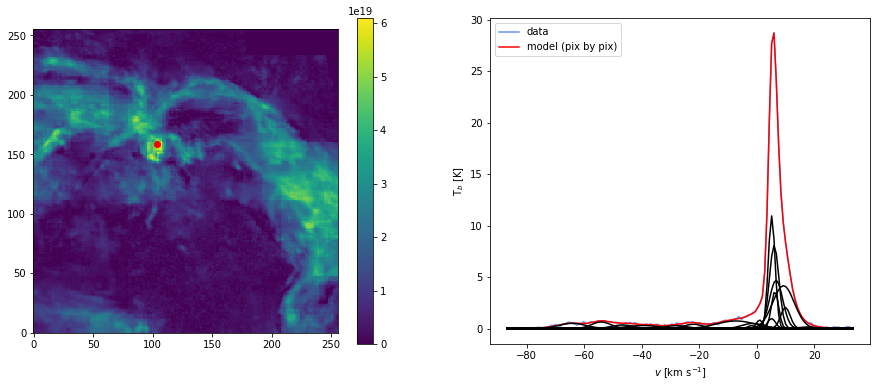

In [82]:
gaussian_idx = np.random.randint(0,40)
plt.figure(figsize=(15,6))
y_pos, x_pos = np.unravel_index(field[gaussian_idx].argmax(), field[gaussian_idx].shape)
print("Gaussian Map:", gaussian_idx)
print("x =", x_pos, ", y =", y_pos)
plt.subplot(1,2,1)
plt.scatter(x_pos, y_pos, color='red')
plt.imshow(field[gaussian_idx], origin='lower')
plt.colorbar()
plt.subplot(1,2,2)
plot_spect(x_pos, y_pos, subvel, model[:, y_pos, x_pos], subcube[:, y_pos, x_pos], gaussian)

Velocity maps:

<Figure size 432x288 with 0 Axes>

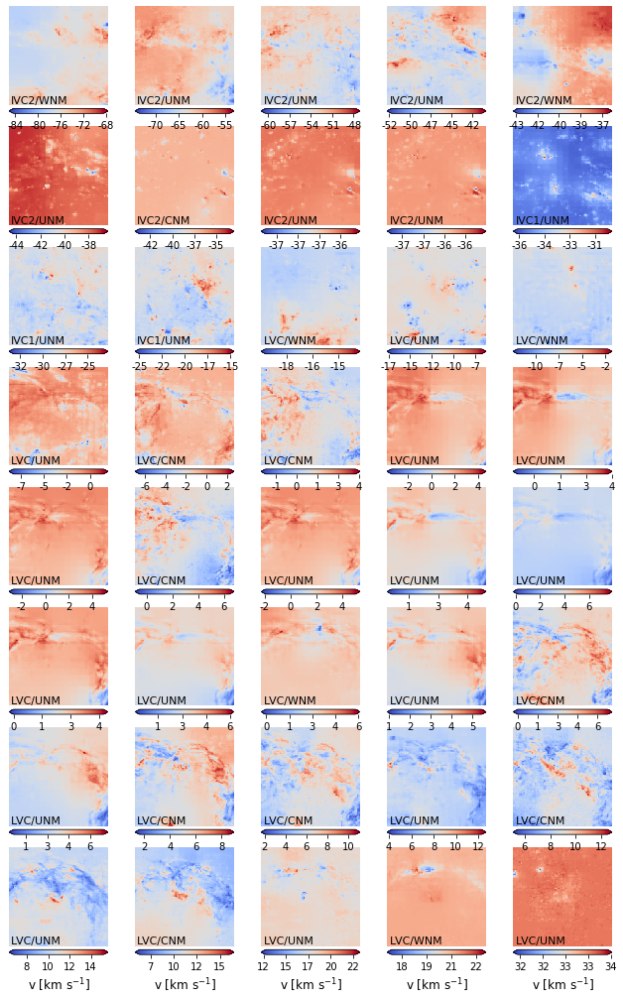

In [68]:
#Plot mosaic field mean
fig = plt.figure()
lh = 8; lw = 5
fig, axs = plt.subplots(lh, lw, sharex=True, sharey=True, figsize=(cm2inch((22.,35.5))))
fig.subplots_adjust(top=1., bottom=0.05, left=0., right=1., hspace=0.12, wspace=0.1)
k = 0
for i in np.arange(lh):
    for j in np.arange(lw):
        elev_min=np.nanmin(vfield[k])
        elev_max=np.nanmax(vfield[k])
        mid_val=0
        im1 = axs[i][j].imshow(vfield[k], origin="lower", cmap="coolwarm")
        color = "black"
        if np.mean(sigfield[k]) <= CNM_UNM_LVC_bound:
            if np.mean(vfield[k]) >= LVC_IVC1_bound_CNM_UNM:
                axs[i][j].text(5,5,"LVC/CNM", color=color, size=11.)
        if np.mean(sigfield[k]) <= CNM_UNM_IVC1_2_bound:
            if np.mean(vfield[k]) < LVC_IVC1_bound_CNM_UNM and np.mean(vfield[k]) >= IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC1/CNM", color=color, size=11.)
            if np.mean(vfield[k]) < IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC2/CNM", color=color, size=11.)
        if np.mean(sigfield[k]) > CNM_UNM_LVC_bound and np.mean(sigfield[k]) <= UNM_WNM_bound:
            if np.mean(vfield[k]) >= LVC_IVC1_bound_CNM_UNM:
                axs[i][j].text(5,5,"LVC/UNM", color=color, size=11.)
        if np.mean(sigfield[k]) > CNM_UNM_IVC1_2_bound and np.mean(sigfield[k]) <= UNM_WNM_bound:
            if np.mean(vfield[k]) < LVC_IVC1_bound_CNM_UNM and np.mean(vfield[k]) >= IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC1/UNM", color=color, size=11.)
            if np.mean(vfield[k]) < IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC2/UNM", color=color, size=11.)
        if np.mean(sigfield[k]) > UNM_WNM_bound:
            if np.mean(vfield[k]) >= LVC_IVC1_bound_WNM:
                axs[i][j].text(5,5,"LVC/WNM", color=color, size=11.)
            if np.mean(vfield[k]) < LVC_IVC1_bound_WNM and np.mean(vfield[k]) >= IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC1/WNM", color=color, size=11.)
            if np.mean(vfield[k]) < IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC2/WNM", color=color, size=11.)   
 
        if j == 0: axs[i][j].set_ylabel(r'y')
        axs[i][j].set_xlabel(r'x')
        axs[i][j].axes.xaxis.set_ticklabels([])
        axs[i][j].axis('off')
        divider = make_axes_locatable(axs[i][j])
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        cbar = fig.colorbar(im1, cax=cax, orientation='horizontal', format='%d', extend="both")
        tick_locator = ticker.MaxNLocator(nbins=5)
        cbar.locator = tick_locator
        cbar.update_ticks()
        cbar.ax.tick_params(labelsize=10.)
        if i == lh-1 : cbar.set_label(r"v [km s$^{-1}$]", fontsize=12.)
        k += 1
#fig.savefig("Velocity_Maps_of_each_component.png", bbox_inches="tight")

Velocity Dispersion maps:

<Figure size 432x288 with 0 Axes>

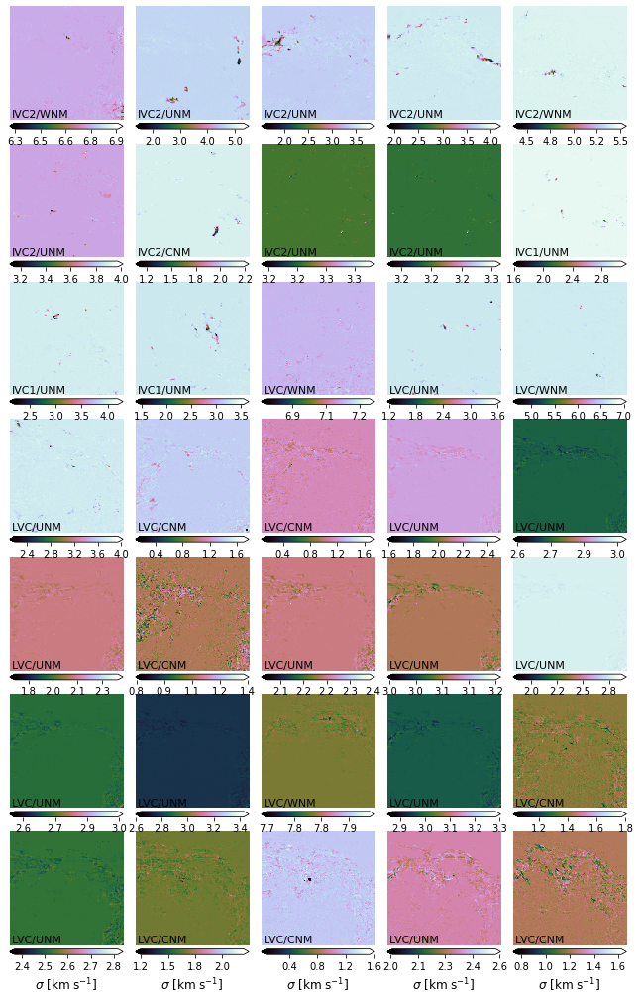

In [69]:
#Plot mosaic field sigma   
fig = plt.figure()
lh = 7; lw = 5
fig, axs = plt.subplots(lh, lw, sharex=True, sharey=True, figsize=(cm2inch((22.,35.5))))
fig.subplots_adjust(top=1., bottom=0.05, left=0., right=1., hspace=0.12, wspace=0.1)
k = 0
for i in np.arange(lh):
    for j in np.arange(lw):
        im1 = axs[i][j].imshow(sigfield[k], origin="lower", cmap="cubehelix")
        color = "black"
        if np.mean(sigfield[k]) <= CNM_UNM_LVC_bound:
            if np.mean(vfield[k]) >= LVC_IVC1_bound_CNM_UNM:
                axs[i][j].text(5,5,"LVC/CNM", color=color, size=11.)
        if np.mean(sigfield[k]) <= CNM_UNM_IVC1_2_bound:
            if np.mean(vfield[k]) < LVC_IVC1_bound_CNM_UNM and np.mean(vfield[k]) >= IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC1/CNM", color=color, size=11.)
            if np.mean(vfield[k]) < IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC2/CNM", color=color, size=11.)
        if np.mean(sigfield[k]) > CNM_UNM_LVC_bound and np.mean(sigfield[k]) <= UNM_WNM_bound:
            if np.mean(vfield[k]) >= LVC_IVC1_bound_CNM_UNM:
                axs[i][j].text(5,5,"LVC/UNM", color=color, size=11.)
        if np.mean(sigfield[k]) > CNM_UNM_IVC1_2_bound and np.mean(sigfield[k]) <= UNM_WNM_bound:
            if np.mean(vfield[k]) < LVC_IVC1_bound_CNM_UNM and np.mean(vfield[k]) >= IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC1/UNM", color=color, size=11.)
            if np.mean(vfield[k]) < IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC2/UNM", color=color, size=11.)
        if np.mean(sigfield[k]) > UNM_WNM_bound:
            if np.mean(vfield[k]) >= LVC_IVC1_bound_WNM:
                axs[i][j].text(5,5,"LVC/WNM", color=color, size=11.)
            if np.mean(vfield[k]) < LVC_IVC1_bound_WNM and np.mean(vfield[k]) >= IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC1/WNM", color=color, size=11.)
            if np.mean(vfield[k]) < IVC1_IVC2_bound:
                axs[i][j].text(5,5,"IVC2/WNM", color=color, size=11.)    
 
        if j == 0: axs[i][j].set_ylabel(r'y')
        axs[i][j].set_xlabel(r'x')
        axs[i][j].axes.xaxis.set_ticklabels([])
        axs[i][j].axis('off')
        divider = make_axes_locatable(axs[i][j])
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        cbar = fig.colorbar(im1, cax=cax, orientation='horizontal', format='%.1f', extend="both")
        tick_locator = ticker.MaxNLocator(nbins=5)
        cbar.locator = tick_locator
        cbar.update_ticks()
        cbar.ax.tick_params(labelsize=10.)
        if i == lh-1 : cbar.set_label(r"$\sigma$ [km s$^{-1}$]", fontsize=12.)
        k += 1
#fig.savefig("Velocity_Dispersion_Maps_of_each_component.pdf", bbox_inches="tight")

## Plot a residual map

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


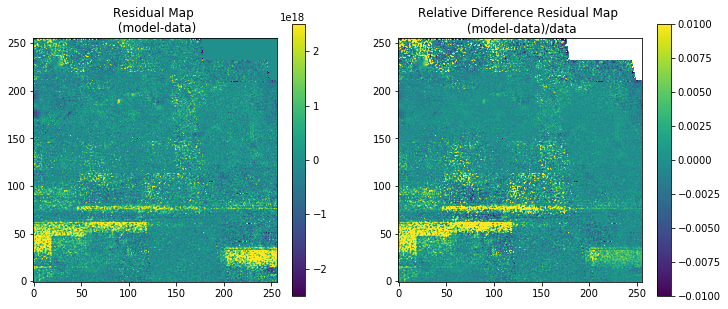

In [70]:
# Find the residual map
fig = plt.figure(figsize=(12,5))
mdl = np.sum(model[:400] , 0)*C*dv
dat = np.sum(subcube[:400], 0)*C*dv
res = (mdl - dat)
plt.subplot(1,2,1) ; plt.title("Residual Map \n (model-data)")
plt.imshow(res, origin="lower", vmin=-0.025e20, vmax=0.025e20)
plt.colorbar()
plt.subplot(1,2,2) ; plt.title("Relative Difference Residual Map \n (model-data)/data")
plt.imshow(res/dat, origin="lower", vmin=0.01, vmax=-0.01)
plt.colorbar()
#fig.savefig("Residual_map.png", bbox_inches="tight")

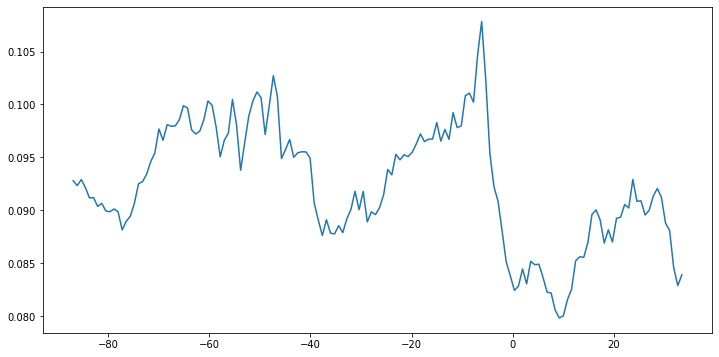

In [71]:
# Standard deviation spectrum
difference_cube = model - subcube
fig = plt.figure(figsize=(12,6))
plt.plot(subvel, np.std((difference_cube), (1,2)))
plt.show()
#fig.savefig("Standard_Deviation_spectrum.pdf", bbox_inches='tight')

## Write out to .fits file

In [72]:
#new_hdr = fits.Header()
new_hdr = hdr

In [73]:
empty_primary = fits.PrimaryHDU(______, header=new_hdr)

hdulist = fits.HDUList([empty_primary])
hdulist.writeto("______.fits", clobber=True)

NameError: name '______' is not defined